In [4]:
import os
import json
import multiprocessing
from multiprocessing import Pool
from functools import partial
import argparse
import numpy as np
import pandas as pd
import awkward as ak
from omegaconf import OmegaConf
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from matplotlib.lines import Line2D
import mplhep as hep
hep.style.use("CMS")
import seaborn
import torch
import torch.nn.functional as F
import pandas as pd
from tthbb_spanet import DCTRDataset
from ttbb_dctr.models.binary_classifier import BinaryClassifier
from ttbb_dctr.lib.data_preprocessing import get_device, get_datasets_list, get_tensors, get_input_features, load_standard_scaler
from ttbb_dctr.lib.plotting import plot_correlation, plot_correlation_matrix, plot_classifier_score, plot_dctr_weight, plot_closure_test, plot_closure_test_split_by_weight, get_central_interval, get_quantiles_by_njet

import matplotlib 
import corner
#matplotlib.use("Qt5Agg")

In [2]:
%matplotlib inline
matplotlib.get_backend()

'module://matplotlib_inline.backend_inline'

In [5]:
def get_epoch(s):
    return int(s.split("-")[0].split("=")[-1])

def load_model(log_directory, epoch=None):
    assert "checkpoints" in os.listdir(os.path.join(log_directory)), "No checkpoints found in log directory"
    assert "hparams.yaml" in os.listdir(log_directory), "No hparams.yaml found in log directory"
    hparams = OmegaConf.load(os.path.join(log_directory, "hparams.yaml"))
    if epoch is None:
        checkpoint = os.path.join(log_directory, "checkpoints", "last.ckpt")
    else:
        checkpoints_by_epoch = [c for c in os.listdir(os.path.join(log_directory, "checkpoints")) if not "last.ckpt" in c]
        checkpoints = list(filter(lambda x : get_epoch(x) == epoch, checkpoints_by_epoch))
        assert len(checkpoints) == 1, f"Found {len(checkpoints)} checkpoints for epoch {epoch}"
        checkpoint = os.path.join(log_directory, "checkpoints", checkpoints[0])
    print("Loading model from checkpoint:", checkpoint)
    model = BinaryClassifier.load_from_checkpoint(checkpoint, **hparams)
    return model

def load_training_config(log_directory):
    filename = "cfg_training.yaml"
    assert filename in os.listdir(log_directory), f"No {filename} found in log directory"
    cfg_training = OmegaConf.load(os.path.join(log_directory, filename))
    return cfg_training

In [6]:
log_directory= "/eos/user/m/mmarcheg/ttHbb/dctr/training/spanet_v2_bugfix/tthbb_0p40To0p75/features_8/binary_classifier_full_Run2_batch8092_lr5e-3/lightning_logs/version_0"
params_CR = "../parameters/spanet_v2/CR/tthbb_0p40To0p75/features_8/run_parameters_tthbb_0p40To0p75_valid.yaml"
params_SR = "../parameters/spanet_v2/SR/tthbb_0p75To1p00/features_8/run_parameters_tthbb_0p75To1p00.yaml"

In [7]:
cfg_training = load_training_config(log_directory)

In [8]:
cfg_training

{'epochs': 3000, 'learning_rate': 0.005, 'weight_decay': 0, 'scheduler': None, 'T_max': None, 'gamma': None, 'batch_size': 8092, 'patience': 100, 'training_file': '/eos/user/m/mmarcheg/ttHbb/dctr/training_datasets/spanet_v2/tthbb_0p40To0p75_ttlf0p30/dataset_dctr_tthbb_0p40To0p75_ttlf0p30_tthbb0p40To0p75_ttlf0p30_train_1837027.parquet', 'test_file': '/eos/user/m/mmarcheg/ttHbb/dctr/training_datasets/spanet_v2/tthbb_0p40To0p75_ttlf0p30/dataset_dctr_tthbb_0p40To0p75_ttlf0p30_tthbb0p40To0p75_ttlf0p30_test_459827.parquet', 'input_features': ['njet', 'nbjet', 'ht', 'ht_b', 'ht_light', 'drbb_min', 'mbb_closest', 'bjet_pt_3']}

In [9]:
cfg_CR = OmegaConf.load(params_CR)
cfg_SR = OmegaConf.load(params_SR)
cfg_training = cfg_CR["training"]


In [10]:
standard_scaler_dir = os.path.join(log_directory, "../..", "standard_scaler")
standard_scaler = load_standard_scaler(standard_scaler_dir)

Loading standard scaler from /eos/user/m/mmarcheg/ttHbb/dctr/training/spanet_v2_bugfix/tthbb_0p40To0p75/features_8/binary_classifier_full_Run2_batch8092_lr5e-3/lightning_logs/version_0/../../standard_scaler/standard_scaler_train_1837027.pkl


/cvmfs/sft.cern.ch/lcg/views/LCG_106a_swan/x86_64-el9-gcc13-opt/lib/python3.11/site-packages/sklearn/base.py:376: InconsistentVersionWarning: Trying to unpickle estimator StandardScaler from version 1.5.2 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


In [12]:
cfg_CR

{'model': {'hidden_size': 50, 'output_size': 1, 'num_hidden_layers': 1}, 'training': {'epochs': 3000, 'learning_rate': 0.005, 'weight_decay': 0, 'scheduler': 'CosineAnnealingLR', 'T_max': 300, 'gamma': 0.99, 'batch_size': 8092, 'patience': 100, 'training_file': '/eos/user/m/mmarcheg/ttHbb/dctr/training_datasets/spanet_v2/tthbb_0p40To0p75_ttlf0p30/dataset_dctr_tthbb_0p40To0p75_ttlf0p30_tthbb0p40To0p75_ttlf0p30_train_1837027.parquet', 'test_file': '/eos/user/m/mmarcheg/ttHbb/dctr/training_datasets/spanet_v2/tthbb_0p40To0p75_ttlf0p30/dataset_dctr_tthbb_0p40To0p75_ttlf0p30_tthbb0p40To0p75_ttlf0p30_full_2296854.parquet', 'input_features': ['njet', 'nbjet', 'ht', 'ht_b', 'ht_light', 'drbb_min', 'mbb_closest', 'bjet_pt_3']}, 'jobs': {'path': '/afs/cern.ch/work/m/mmarcheg/ttHbb/ttbb-DCTR', 'model': 'binary_classifier_dctr', 'job_flavour': 'testmatch', 'ngpu': 1, 'ncpu': 3}}

In [32]:
dataset_CR = DCTRDataset(cfg_CR.training["test_file"], shuffle=False, reweigh=False, label=False)
events_CR = dataset_CR.df


input_features_CR = get_input_features(events_CR, only=cfg_CR.training.get("input_features", None))
X_CR, Y_CR, W_CR = get_tensors(input_features_CR, events_CR.dctr, 
                                         events_CR.event.weight, 
                                         standard_scaler=standard_scaler, 
                                         normalize_weights=False)

No configuration file provided. Loading default configuration parameters.
Reading 1 parquet files:  ['/eos/user/m/mmarcheg/ttHbb/dctr/training_datasets/spanet_v2/tthbb_0p40To0p75_ttlf0p30/dataset_dctr_tthbb_0p40To0p75_ttlf0p30_tthbb0p40To0p75_ttlf0p30_full_2296854.parquet']
Reading file:  /eos/user/m/mmarcheg/ttHbb/dctr/training_datasets/spanet_v2/tthbb_0p40To0p75_ttlf0p30/dataset_dctr_tthbb_0p40To0p75_ttlf0p30_tthbb0p40To0p75_ttlf0p30_full_2296854.parquet
Using device: cpu


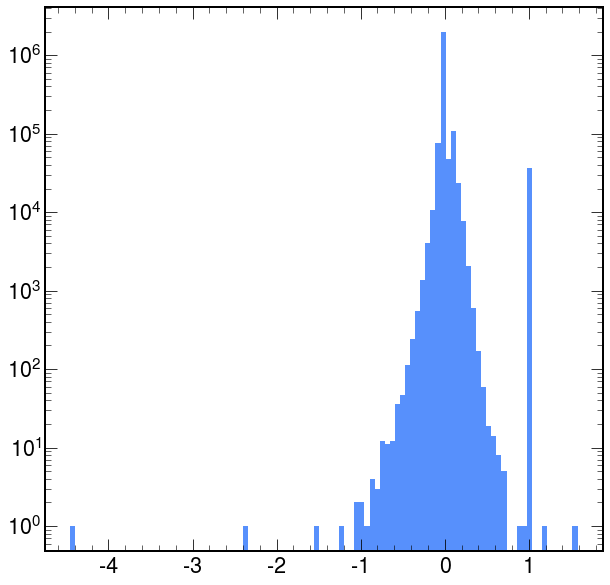

In [33]:
plt.hist(events_CR.event.weight.to_numpy(), bins=100)
plt.yscale("log")

In [34]:
W_CR.mean()

tensor(0.0160)

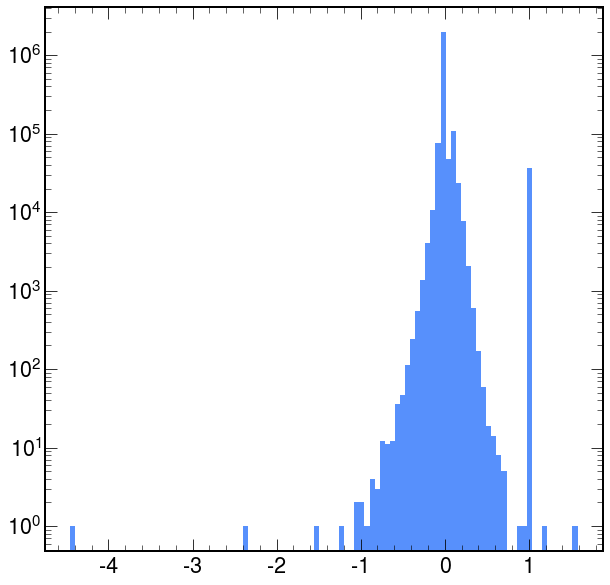

In [35]:
plt.hist(W_CR.numpy(), bins=100)
plt.yscale("log")

In [36]:
dataset_SR = DCTRDataset(cfg_SR.training["test_file"], shuffle=False, reweigh=False, label=False)
events_SR = dataset_SR.df


input_features_SR = get_input_features(events_SR, only=cfg_SR.training.get("input_features", None))
X_SR, Y_SR, W_SR = get_tensors(input_features_SR, events_SR.dctr, 
                                        events_SR.event.weight, 
                                        standard_scaler=standard_scaler, 
                                        normalize_weights=False)


No configuration file provided. Loading default configuration parameters.
Reading 1 parquet files:  ['/eos/user/m/mmarcheg/ttHbb/dctr/training_datasets/spanet_v2_extrapolation/tthbb_0p75To1p00_ttlf0p30/dataset_dctr_tthbb_0p75To1p00_ttlf0p30_full_1350313.parquet']
Reading file:  /eos/user/m/mmarcheg/ttHbb/dctr/training_datasets/spanet_v2_extrapolation/tthbb_0p75To1p00_ttlf0p30/dataset_dctr_tthbb_0p75To1p00_ttlf0p30_full_1350313.parquet
Using device: cpu


In [37]:
X_SR

tensor([[ 0.8182, -0.5813,  0.6005,  ..., -0.5495, -0.9497,  0.8186],
        [-0.7040,  1.4322, -0.3435,  ..., -0.1926, -0.7075, -0.0628],
        [ 0.0571,  1.4322, -0.4553,  ..., -1.1224, -1.4023,  0.5801],
        ...,
        [ 0.0571,  1.4322, -0.6282,  ..., -0.9856, -0.9904, -0.2874],
        [ 0.8182,  1.4322,  0.0921,  ...,  0.9165, -0.1180,  1.2617],
        [-0.7040, -0.5813, -0.4355,  ...,  0.7457, -0.3546, -0.2546]])

In [55]:
X_full = torch.concatenate([X_CR, X_SR], axis=0)
Y_full = torch.concatenate([Y_CR, Y_SR], axis=0)
W_full = torch.concatenate([W_CR, W_SR], axis=0)
isSR = torch.concatenate([torch.zeros(X_CR.shape[0], dtype=bool), torch.ones(X_SR.shape[0], dtype=bool)], axis=0).numpy()

events = ak.concatenate([events_CR, events_SR])

In [56]:
isSR

array([False, False, False, ...,  True,  True,  True])

In [139]:
# Compute DCTR score and weight
model = load_model(log_directory, epoch=None)
model.eval()
with torch.no_grad():
    predictions = model(X_full)
predictions = F.sigmoid(predictions)
score = predictions[:,0].to("cpu").detach().numpy()
weight_ttbb = score / (1-score)

# Add DCTR score and weight branches to the events
events = ak.with_field(events, score, "dctr_score")
events = ak.with_field(events, weight_ttbb, "dctr_weight")

# Select events in control region, without cut on tthbb
mask_mc = (events.data == 0)
mask_signal = mask_mc & (events.tthbb == 1)
mask_ttbb = mask_mc & (events.ttbb == 1)
mask_ttcc = mask_mc & (events.ttcc == 1)
mask_ttlf = mask_mc & (events.ttlf == 1)
mask_tt2l2nu = mask_mc & (events.tt2l2nu == 1)
mask_singletop = mask_mc & (events.singletop == 1)
mask_otherbkg = mask_mc & ((events.vjets==1)|(events.ttv==1)|(events.vv==1))
mask_data_minus_minor_bkg = (events.dctr == 1)
masks_njet = {
    "4j": ak.num(events.JetGood) == 4,
    "5j": ak.num(events.JetGood) == 5,
    "6j": ak.num(events.JetGood) == 6,
    ">=7j": ak.num(events.JetGood) >= 7,
}

events.events = ak.with_field(events.events, events.BJetGood[:, 2].pt, "bjet_pt_3")
events.events = ak.with_field(events.events, ak.num(events.BJetGood), "nbjets")
events.events = ak.with_field(events.events, ak.num(events.JetGood), "njets")

Loading model from checkpoint: /eos/user/m/mmarcheg/ttHbb/dctr/training/spanet_v2_bugfix/tthbb_0p40To0p75/features_8/binary_classifier_full_Run2_batch8092_lr5e-3/lightning_logs/version_0/checkpoints/last.ckpt


/cvmfs/sft.cern.ch/lcg/views/LCG_106a_swan/x86_64-el9-gcc13-opt/lib/python3.11/site-packages/pytorch_lightning/utilities/migration/utils.py:56: The loaded checkpoint was produced with Lightning v2.5.0.post0, which is newer than your current Lightning version: v2.2.4


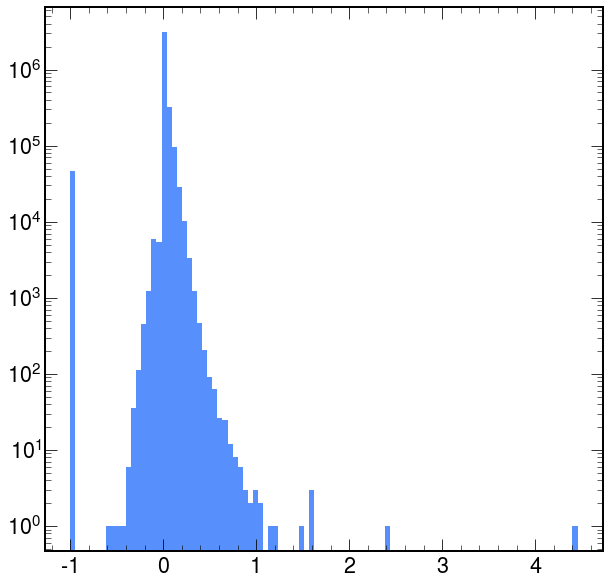

In [70]:
weights = ak.to_numpy(events.event.weight)
weights = weights* np.where(~mask_ttbb, -1, 1)
plt.hist(weights, bins=100)
plt.yscale("log")

In [71]:
weights

<Array [0.000431, -0.000565, ... 0.00178] type='3647167 * float64'>

In [72]:
weight_cut_bynjet = json.load(open("weight_cuts_by_njet.json"))

In [73]:
weight_cut_bynjet

{'njet=4': [[0, 1.005998134613037],
  [1.005998134613037, 1.0372376441955566],
  [1.0372376441955566, 3]],
 'njet=5': [[0, 0.9859388868014017],
  [0.9859388868014017, 1.0171554883321126],
  [1.0171554883321126, 3]],
 'njet=6': [[0, 0.9767680366834005],
  [0.9767680366834005, 1.0168344577153523],
  [1.0168344577153523, 3]],
 'njet>=6': [[0, 0.9808544317881266],
  [0.9808544317881266, 1.0223603248596191],
  [1.0223603248596191, 3]],
 'njet>=7': [[0, 0.9861371119817098],
  [0.9861371119817098, 1.028052846590678],
  [1.028052846590678, 3]]}

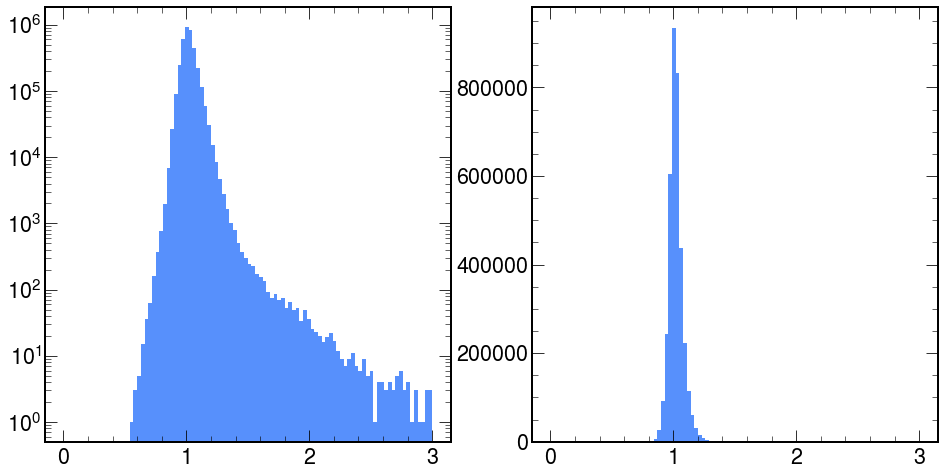

In [74]:
f, (ax, bx) = plt.subplots(1, 2, figsize=(16,8))
ax.hist(events.dctr_weight, bins=100, range=(0,3))
bx.hist(events.dctr_weight, bins=100,range=(0,3))
ax.set_yscale("log")

In [75]:
weight_cut_bynjet

{'njet=4': [[0, 1.005998134613037],
  [1.005998134613037, 1.0372376441955566],
  [1.0372376441955566, 3]],
 'njet=5': [[0, 0.9859388868014017],
  [0.9859388868014017, 1.0171554883321126],
  [1.0171554883321126, 3]],
 'njet=6': [[0, 0.9767680366834005],
  [0.9767680366834005, 1.0168344577153523],
  [1.0168344577153523, 3]],
 'njet>=6': [[0, 0.9808544317881266],
  [0.9808544317881266, 1.0223603248596191],
  [1.0223603248596191, 3]],
 'njet>=7': [[0, 0.9861371119817098],
  [0.9861371119817098, 1.028052846590678],
  [1.028052846590678, 3]]}

In [140]:
njet = ak.num(events.JetGood)
dctr_regions = {
    "4j_L":  (njet == 4)&(events.dctr_weight >= weight_cut_bynjet["njet=4"][0][0])&\
                         (events.dctr_weight < weight_cut_bynjet["njet=4"][0][1]),
    "4j_M":  (njet == 4)&(events.dctr_weight >= weight_cut_bynjet["njet=4"][1][0])&\
                         (events.dctr_weight < weight_cut_bynjet["njet=4"][1][1]),
    "4j_H":  (njet == 4)&(events.dctr_weight >= weight_cut_bynjet["njet=4"][2][0])&\
                         (events.dctr_weight < weight_cut_bynjet["njet=4"][2][1]),

    "5j_L":  (njet == 5)&(events.dctr_weight >= weight_cut_bynjet["njet=5"][0][0])&\
                         (events.dctr_weight < weight_cut_bynjet["njet=5"][0][1]),
    "5j_M":  (njet == 5)&(events.dctr_weight >= weight_cut_bynjet["njet=5"][1][0])&\
                         (events.dctr_weight < weight_cut_bynjet["njet=5"][1][1]),
    "5j_H":  (njet == 5)&(events.dctr_weight >= weight_cut_bynjet["njet=5"][2][0])&\
                         (events.dctr_weight < weight_cut_bynjet["njet=5"][2][1]),
    
    "6j_L":  (njet == 6)&(events.dctr_weight >= weight_cut_bynjet["njet=6"][0][0])&\
                         (events.dctr_weight < weight_cut_bynjet["njet=6"][0][1]),
    "6j_M":  (njet == 6)&(events.dctr_weight >= weight_cut_bynjet["njet=6"][1][0])&\
                         (events.dctr_weight < weight_cut_bynjet["njet=6"][1][1]),
    "6j_H":  (njet == 6)&(events.dctr_weight >= weight_cut_bynjet["njet=6"][2][0])&\
                         (events.dctr_weight < weight_cut_bynjet["njet=6"][2][1]),


    ">=7j_L":  (njet > 6)&(events.dctr_weight >= weight_cut_bynjet["njet>=7"][0][0])&\
                         (events.dctr_weight < weight_cut_bynjet["njet>=7"][0][1]),
    ">=7j_M":  (njet > 6)&(events.dctr_weight >= weight_cut_bynjet["njet>=7"][1][0])&\
                         (events.dctr_weight < weight_cut_bynjet["njet>=7"][1][1]),
    ">=7j_H":  (njet > 6)&(events.dctr_weight >= weight_cut_bynjet["njet>=7"][2][0])&\
                         (events.dctr_weight < weight_cut_bynjet["njet>=7"][2][1])
}

In [67]:
events.fields

['JetGood',
 'LeptonGood',
 'MET',
 'events',
 'spanet_output',
 'tthbb',
 'ttbb',
 'ttcc',
 'ttlf',
 'tt2l2nu',
 'singletop',
 'vjets',
 'ttv',
 'vv',
 'data',
 'dctr',
 'metadata',
 'BJetGood',
 'event',
 'dctr_score',
 'dctr_weight']

In [68]:
events.events.fields

['ht',
 'bjets_ht',
 'lightjets_ht',
 'drbb_min',
 'detabb_min',
 'dphibb_min',
 'drbb_avg',
 'mbb_closest',
 'mbb_min',
 'mbb_max']

In [146]:
hist_settings = {
    "ht" : (80, 0, 1200),
    "bjets_ht" : (80,0,1200),
    "lightjets_ht": (80, 0, 600),
    "drbb_min": (80, 0, 3),
    "mbb_closest": (80,50, 400),
    "bjet_pt_3": (80, 30, 200),
    "nbjets" : (4, 3,7),
    "njets": (6, 5, 10)
}

cols = [ "ht" , "lightjets_ht", "bjets_ht", "bjet_pt_3", "mbb_closest", "drbb_min", "nbjets"]

output_folder= "/eos/user/d/dvalsecc/www/ttHbbPlots/dctr_regions_plots/"

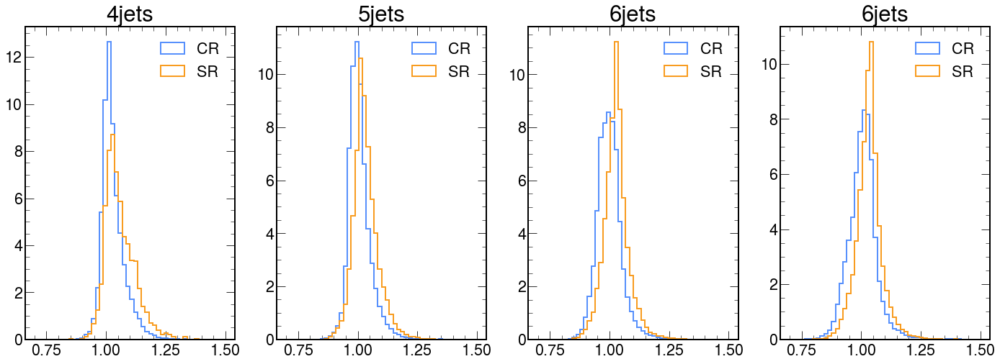

In [81]:
f, axs = plt.subplots(1, 4, figsize=(24,8))
axs[0].hist(events[mask_ttbb & (njet == 4) & ~isSR].dctr_weight, range=(0.7, 1.5), bins=50, histtype="step", linewidth=2, label="CR", density=True)
axs[0].hist(events[mask_ttbb & (njet == 4) & isSR].dctr_weight, range=(0.7, 1.5), bins=50, histtype="step", linewidth=2, label="SR", density=True)
axs[0].set_title("4jets")
axs[0].legend()

axs[1].hist(events[mask_ttbb & (njet == 5) & ~isSR].dctr_weight, range=(0.7, 1.5), bins=50, histtype="step", linewidth=2, label="CR", density=True)
axs[1].hist(events[mask_ttbb & (njet == 5) & isSR].dctr_weight, range=(0.7, 1.5), bins=50, histtype="step", linewidth=2, label="SR", density=True)
axs[1].set_title("5jets")
axs[1].legend()

axs[2].hist(events[mask_ttbb & (njet == 6) & ~isSR].dctr_weight, range=(0.7, 1.5), bins=50, histtype="step", linewidth=2, label="CR", density=True)
axs[2].hist(events[mask_ttbb & (njet == 6) & isSR].dctr_weight, range=(0.7, 1.5), bins=50, histtype="step", linewidth=2, label="SR", density=True)
axs[2].set_title("6jets")
axs[2].legend()

axs[3].hist(events[mask_ttbb & (njet >= 7) & ~isSR].dctr_weight, range=(0.7, 1.5), bins=50, histtype="step", linewidth=2, label="CR", density=True)
axs[3].hist(events[mask_ttbb & (njet >= 7) & isSR].dctr_weight, range=(0.7, 1.5), bins=50, histtype="step", linewidth=2, label="SR", density=True)
axs[3].set_title("6jets")
axs[3].legend()


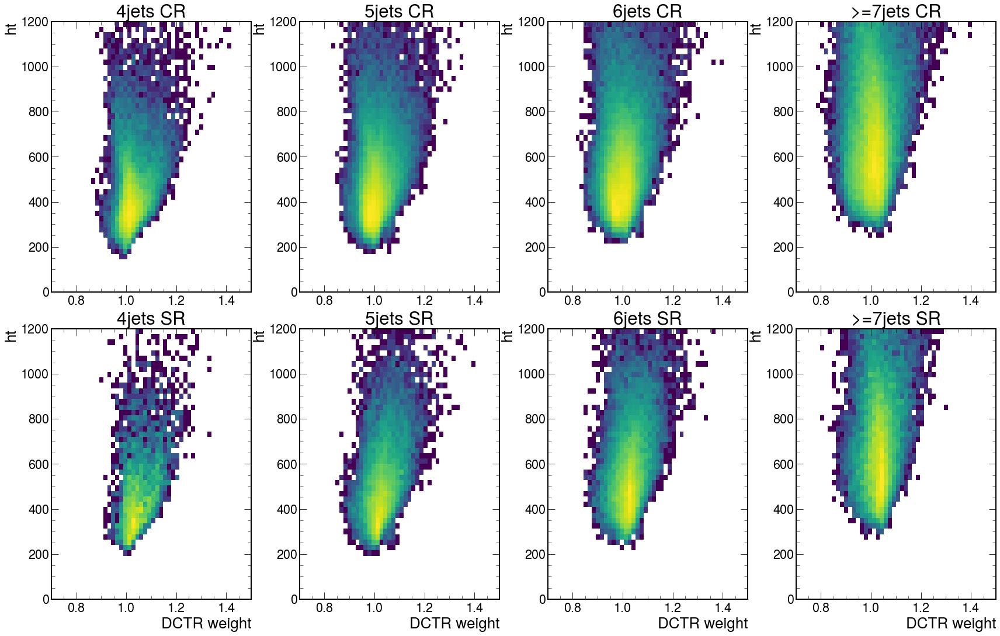

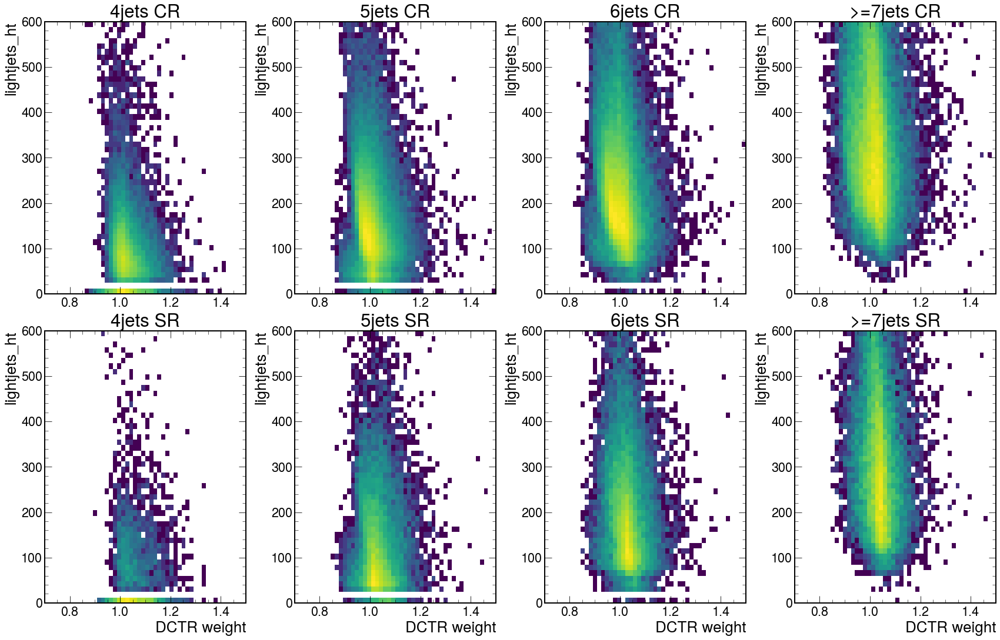

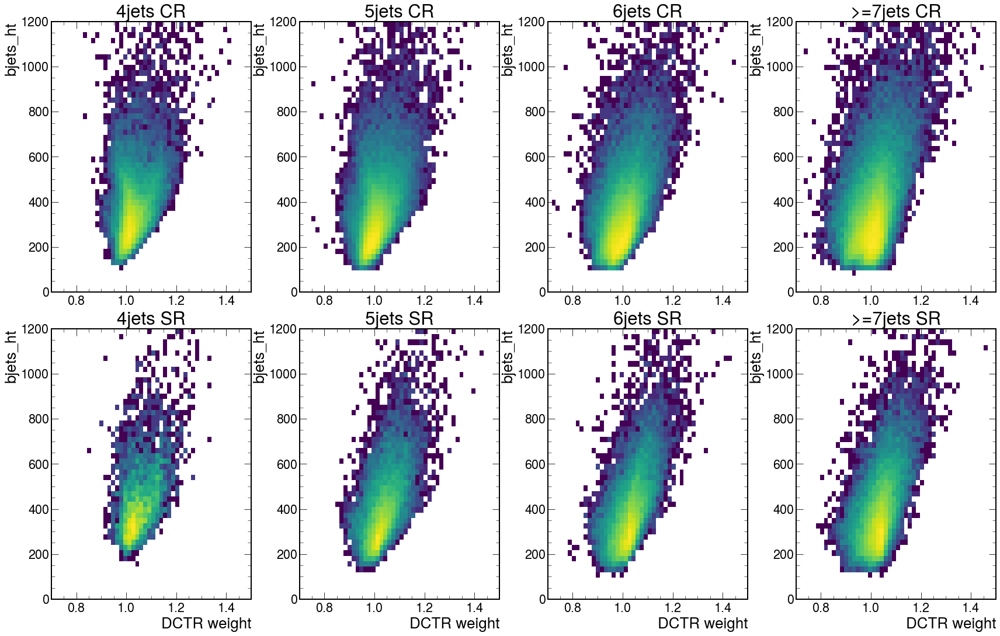

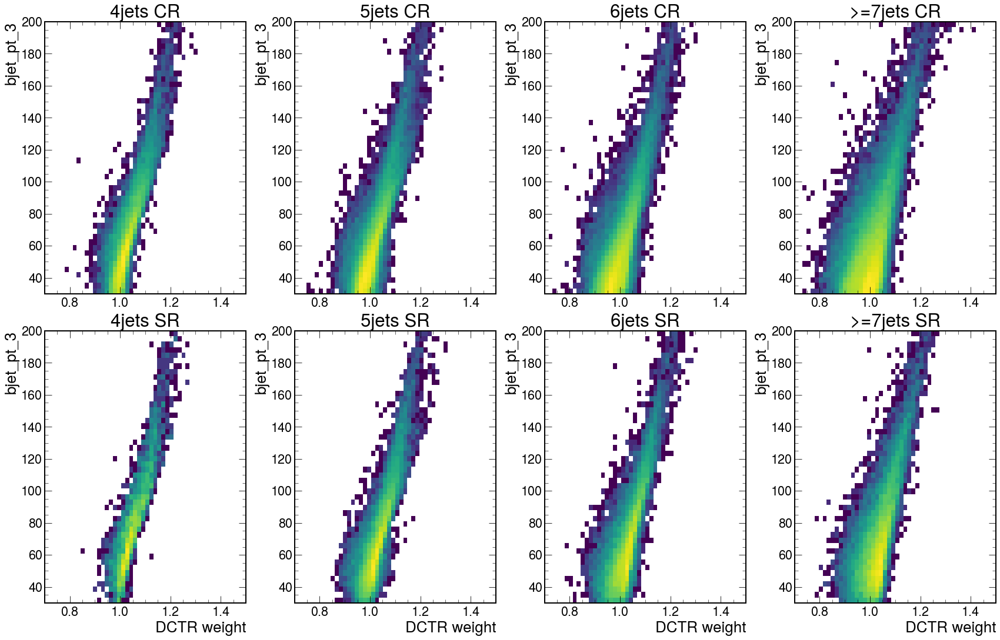

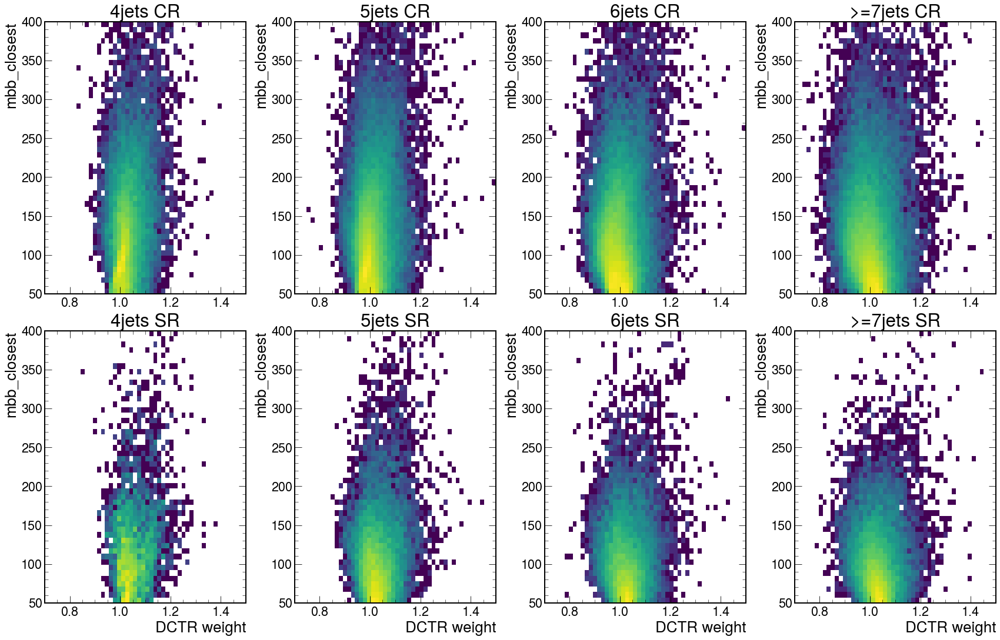

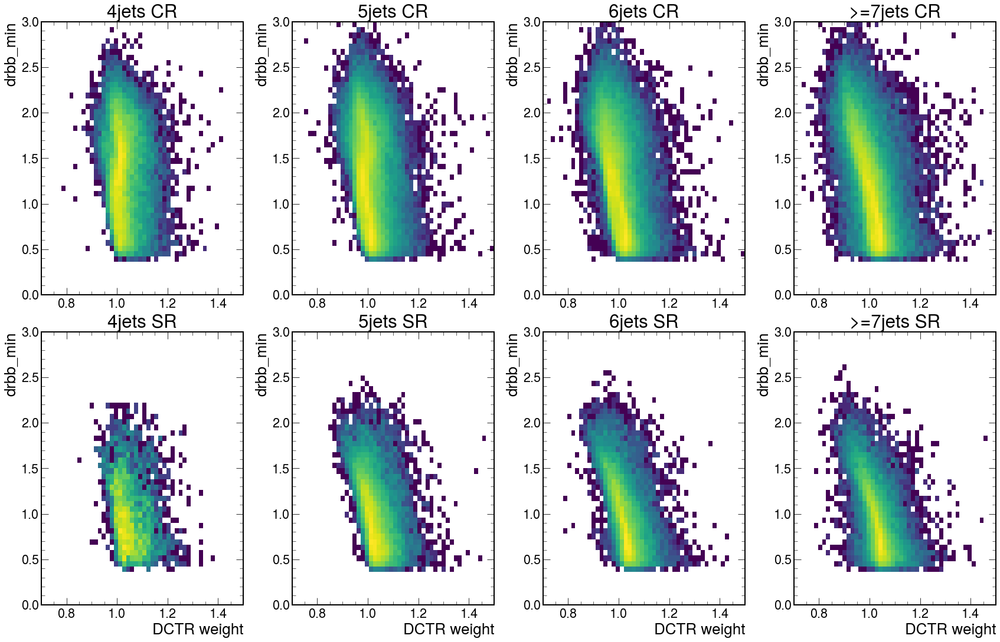

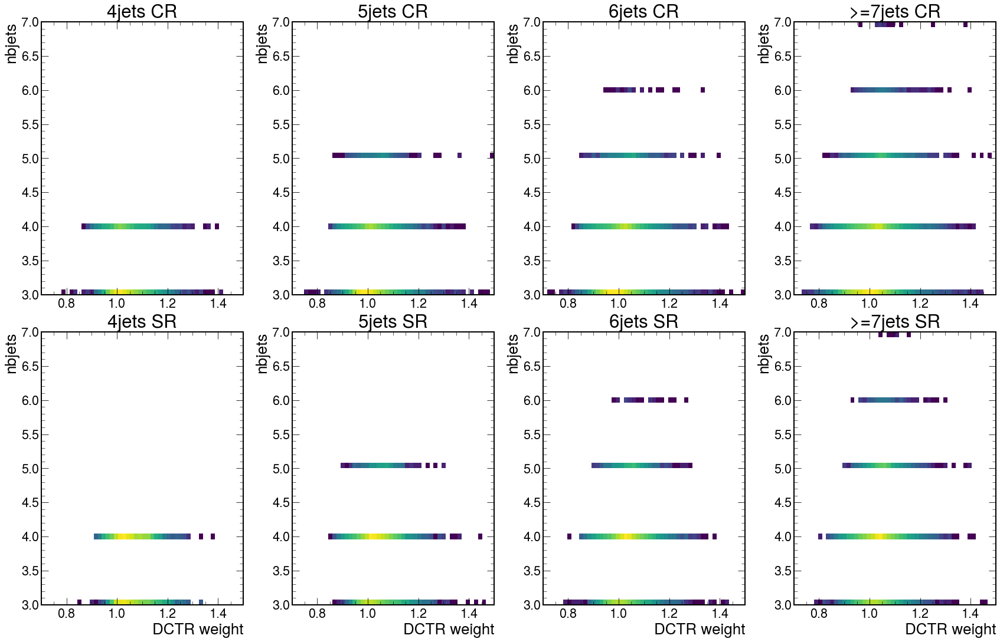

In [148]:
for col in cols:
    f, axs = plt.subplots(2, 4, figsize=(24, 15))
    plt.tight_layout()
    axs[0,0].hist2d(ak.to_numpy(events[mask_ttbb & (njet == 4) & ~isSR].dctr_weight),
                  ak.to_numpy(events.events[col][mask_ttbb & (njet == 4) & ~isSR]),
                  range=((0.7, 1.5), hist_settings[col][1:]), 
                  bins=50, density=True, norm=LogNorm())
    axs[0,0].set_title("4jets CR")
    #axs[0,0].set_xlabel("DCTR weight")
    axs[0,0].set_ylabel(col)

    axs[0,1].hist2d(ak.to_numpy(events[mask_ttbb & (njet == 5) & ~isSR].dctr_weight),
                  ak.to_numpy(events.events[col][mask_ttbb & (njet == 5) & ~isSR]),
                  range=((0.7, 1.5), hist_settings[col][1:]), 
                  bins=50, density=True, norm=LogNorm())
    axs[0,1].set_title("5jets CR")
    #axs[0,1].set_xlabel("DCTR weight")
    axs[0,1].set_ylabel(col)

    axs[0,2].hist2d(ak.to_numpy(events[mask_ttbb & (njet == 6) & ~isSR].dctr_weight),
                  ak.to_numpy(events.events[col][mask_ttbb & (njet == 6) & ~isSR]),
                  range=((0.7, 1.5), hist_settings[col][1:]), 
                  bins=50, density=True, norm=LogNorm())
    axs[0,2].set_title("6jets CR")
    #axs[0,2].set_xlabel("DCTR weight")
    axs[0,2].set_ylabel(col)

    axs[0,3].hist2d(ak.to_numpy(events[mask_ttbb & (njet >= 7) & ~isSR].dctr_weight),
                  ak.to_numpy(events.events[col][mask_ttbb & (njet >= 7) & ~isSR]),
                  range=((0.7, 1.5), hist_settings[col][1:]), 
                  bins=50, density=True, norm=LogNorm())
    axs[0,3].set_title(">=7jets CR")
    #axs[0,3].set_xlabel("DCTR weight")
    axs[0,3].set_ylabel(col)

    axs[1,0].hist2d(ak.to_numpy(events[mask_ttbb & (njet == 4) & isSR].dctr_weight),
                  ak.to_numpy(events.events[col][mask_ttbb & (njet == 4) & isSR]),
                  range=((0.7, 1.5), hist_settings[col][1:]), 
                  bins=50, density=True, norm=LogNorm())
    axs[1,0].set_title("4jets SR")
    axs[1,0].set_xlabel("DCTR weight")
    axs[1,0].set_ylabel(col)

    axs[1,1].hist2d(ak.to_numpy(events[mask_ttbb & (njet == 5) & isSR].dctr_weight),
                  ak.to_numpy(events.events[col][mask_ttbb & (njet == 5) & isSR]),
                  range=((0.7, 1.5), hist_settings[col][1:]), 
                  bins=50, density=True, norm=LogNorm())
    axs[1,1].set_title("5jets SR")
    axs[1,1].set_xlabel("DCTR weight")
    axs[1,1].set_ylabel(col)

    axs[1,2].hist2d(ak.to_numpy(events[mask_ttbb & (njet == 6) & isSR].dctr_weight),
                  ak.to_numpy(events.events[col][mask_ttbb & (njet == 6) & isSR]),
                  range=((0.7, 1.5), hist_settings[col][1:]), 
                  bins=50, density=True, norm=LogNorm())
    axs[1,2].set_title("6jets SR")
    axs[1,2].set_xlabel("DCTR weight")
    axs[1,2].set_ylabel(col)

    axs[1,3].hist2d(ak.to_numpy(events[mask_ttbb & (njet >= 7) & isSR].dctr_weight),
                  ak.to_numpy(events.events[col][mask_ttbb & (njet >= 7) & isSR]),
                  range=((0.7, 1.5), hist_settings[col][1:]), 
                  bins=50, density=True, norm=LogNorm())
    axs[1,3].set_title(">=7jets SR")
    axs[1,3].set_xlabel("DCTR weight")
    axs[1,3].set_ylabel(col)
    plt.savefig(output_folder+f'/dctr_vs_{col}_ttbb.png')
    plt.savefig(output_folder+f'/dctr_vs_{col}_ttbb.pdf')

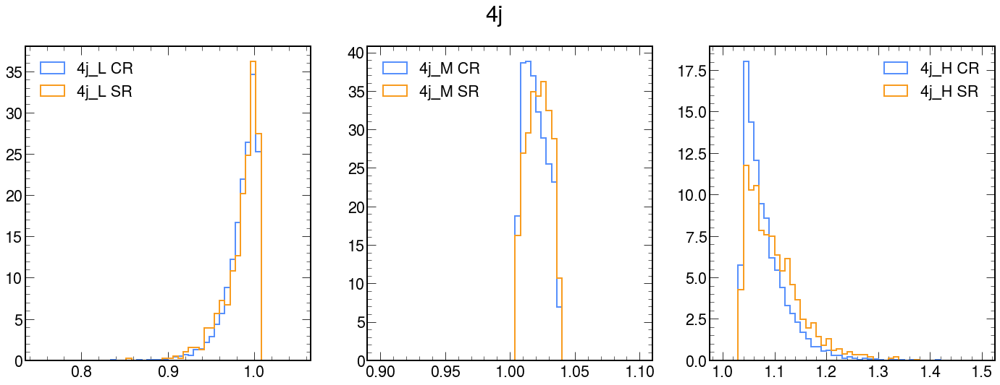

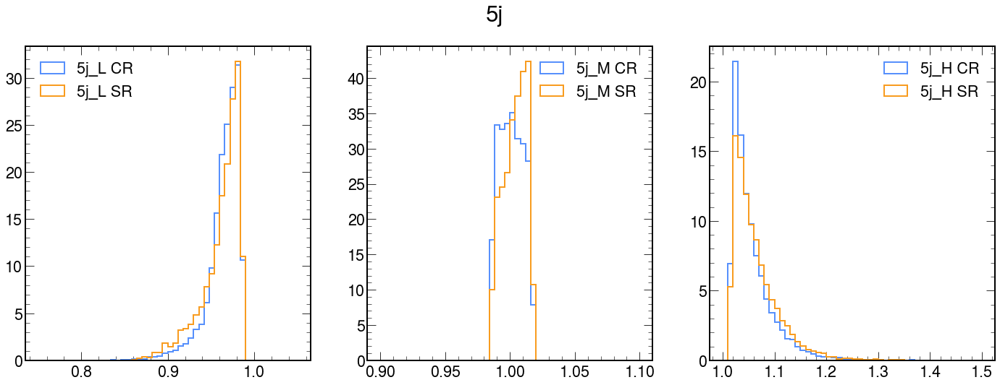

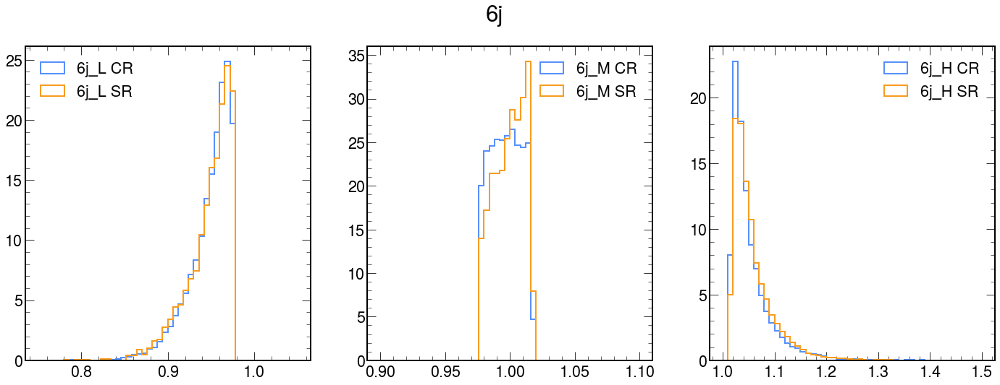

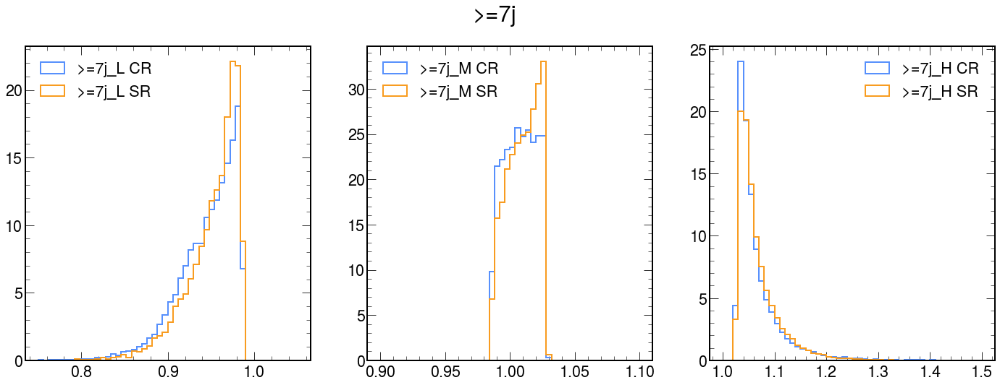

In [94]:
dctr_ranges= [[0.75, 1.05],[0.9, 1.1], [ 1,1.5]]

for njets in ["4j","5j","6j", ">=7j"]:
    f, (ax, bx, cx ) = plt.subplots(1, 3, figsize=(24,8))
    ax.hist(events[mask_ttbb & dctr_regions[f"{njets}_L"] & ~isSR].dctr_weight, range=dctr_ranges[0], bins=50,histtype="step", linewidth=2, label=f"{njets}_L CR", density=True )
    ax.hist(events[mask_ttbb & dctr_regions[f"{njets}_L"] & isSR].dctr_weight, range=dctr_ranges[0], bins=50,histtype="step", linewidth=2, label=f"{njets}_L SR", density=True  )
    bx.hist(events[mask_ttbb & dctr_regions[f"{njets}_M"] & ~isSR].dctr_weight, range=dctr_ranges[1], bins=50,histtype="step", linewidth=2, label=f"{njets}_M CR", density=True  )
    bx.hist(events[mask_ttbb & dctr_regions[f"{njets}_M"] & isSR].dctr_weight, range=dctr_ranges[1], bins=50,histtype="step", linewidth=2, label=f"{njets}_M SR", density=True  )
    cx.hist(events[mask_ttbb & dctr_regions[f"{njets}_H"] & ~isSR].dctr_weight, range=dctr_ranges[2], bins=50,histtype="step", linewidth=2, label=f"{njets}_H CR", density=True  )
    cx.hist(events[mask_ttbb & dctr_regions[f"{njets}_H"] & isSR].dctr_weight, range=dctr_ranges[2], bins=50,histtype="step", linewidth=2, label=f"{njets}_H SR", density=True  )
    ax.legend()
    bx.legend()
    cx.legend()
    f.suptitle(f"{njets}", fontsize="large")

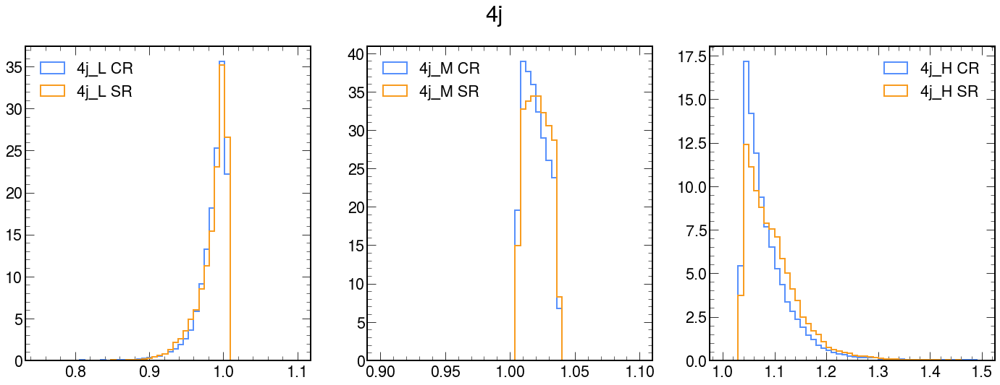

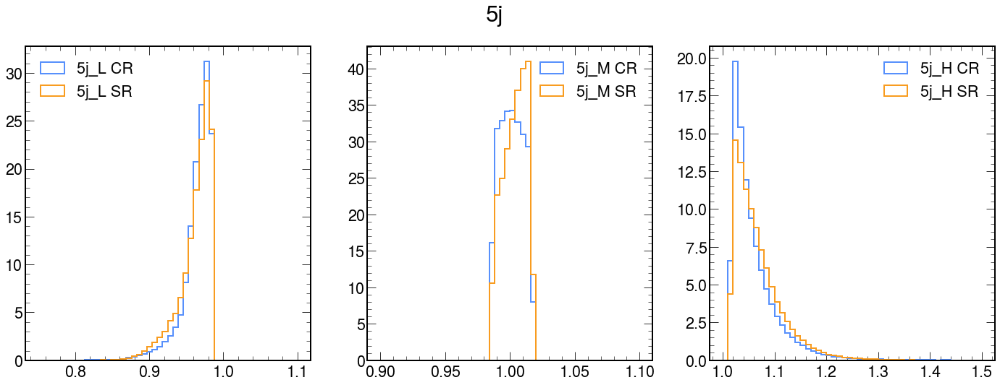

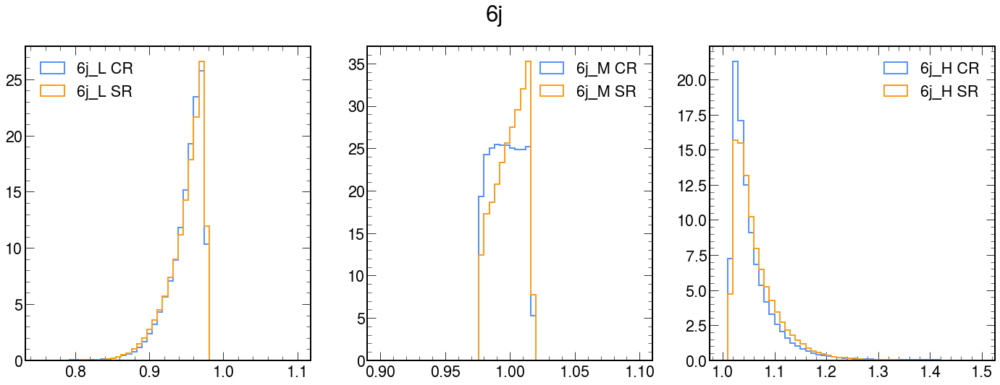

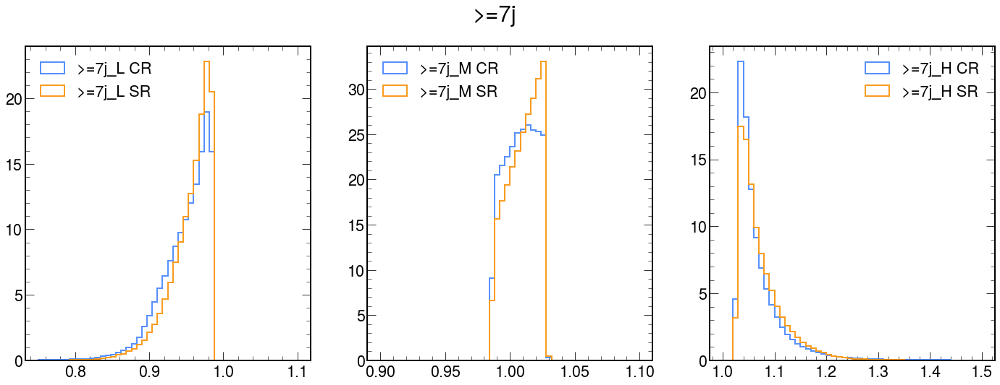

In [95]:
dctr_ranges= [[0.75, 1.1],[0.9, 1.1], [ 1,1.5]]

for njets in ["4j","5j","6j", ">=7j"]:
    f, (ax, bx, cx ) = plt.subplots(1, 3, figsize=(24,8))
    ax.hist(events[mask_mc & ~mask_ttbb & dctr_regions[f"{njets}_L"] & ~isSR].dctr_weight, range=dctr_ranges[0], bins=50,histtype="step", linewidth=2, label=f"{njets}_L CR", density=True )
    ax.hist(events[mask_mc & ~mask_ttbb & dctr_regions[f"{njets}_L"] & isSR].dctr_weight, range=dctr_ranges[0], bins=50,histtype="step", linewidth=2, label=f"{njets}_L SR", density=True  )
    bx.hist(events[mask_mc & ~mask_ttbb & dctr_regions[f"{njets}_M"] & ~isSR].dctr_weight, range=dctr_ranges[1], bins=50,histtype="step", linewidth=2, label=f"{njets}_M CR", density=True  )
    bx.hist(events[mask_mc & ~mask_ttbb & dctr_regions[f"{njets}_M"] & isSR].dctr_weight, range=dctr_ranges[1], bins=50,histtype="step", linewidth=2, label=f"{njets}_M SR", density=True  )
    cx.hist(events[mask_mc & ~mask_ttbb & dctr_regions[f"{njets}_H"] & ~isSR].dctr_weight, range=dctr_ranges[2], bins=50,histtype="step", linewidth=2, label=f"{njets}_H CR", density=True  )
    cx.hist(events[mask_mc & ~mask_ttbb & dctr_regions[f"{njets}_H"] & isSR].dctr_weight, range=dctr_ranges[2], bins=50,histtype="step", linewidth=2, label=f"{njets}_H SR", density=True  )
    ax.legend()
    bx.legend()
    cx.legend()
    f.suptitle(f"{njets}", fontsize="large")

In [147]:
def plot_comparison_SR_DR(variable, njets, mask, output_folder, text="", density=True, apply_weight=False):
    f, (ax, bx, cx,r1x, r2x) = plt.subplots(1, 5, figsize=(40,8))
    nbins, range0, range1 = hist_settings[variable]
    ax.hist(events.events[variable][mask & dctr_regions[f"{njets}_L"] & ~isSR], bins=nbins, density=density, range=(range0,range1),
                            label="CR",  histtype="step", linewidth=2,
           weights= weights[mask & dctr_regions[f"{njets}_L"] & ~isSR]);
    bx.hist(events.events[variable][mask & dctr_regions[f"{njets}_M"]& ~isSR], bins=nbins, density=density, range=(range0,range1),
                                        label="CR",      histtype="step", linewidth=2,
           weights= weights[mask & dctr_regions[f"{njets}_M"] & ~isSR]);
    cx.hist(events.events[variable][mask & dctr_regions[f"{njets}_H"]& ~isSR], bins=nbins, density=density, range=(range0,range1),
                                          label="CR", histtype="step", linewidth=2,
              weights= weights[mask & dctr_regions[f"{njets}_H"] & ~isSR]);
    
    ax.hist(events.events[variable][mask & dctr_regions[f"{njets}_L"] & isSR], bins=nbins, density=density, range=(range0,range1),
                           label="SR",  histtype="step", linewidth=2.,
            weights= weights[mask & dctr_regions[f"{njets}_L"] & isSR]);
    bx.hist(events.events[variable][mask & dctr_regions[f"{njets}_M"]& isSR], bins=nbins, density=density, range=(range0,range1),
                            label="SR",   histtype="step", linewidth=2,
                        weights= weights[mask & dctr_regions[f"{njets}_M"] & isSR]);
    cx.hist(events.events[variable][mask & dctr_regions[f"{njets}_H"]& isSR], bins=nbins, density=density, range=(range0,range1),
                                          label="SR", histtype="step", linewidth=2,
            weights= weights[mask & dctr_regions[f"{njets}_H"] &isSR]);

    r1x.hist(events.events[variable][mask & dctr_regions[f"{njets}_L"] & ~isSR], bins=nbins, density=density, range=(range0,range1),
                            label="L",  histtype="step", linewidth=2,
                weights= weights[mask & dctr_regions[f"{njets}_L"] & ~isSR]);
    r1x.hist(events.events[variable][mask & dctr_regions[f"{njets}_M"]& ~isSR], bins=nbins, density=density, range=(range0,range1),
                                        label="M",      histtype="step", linewidth=2,
                weights= weights[mask & dctr_regions[f"{njets}_M"] & ~isSR]);
    r1x.hist(events.events[variable][mask & dctr_regions[f"{njets}_H"]& ~isSR], bins=nbins, density=density, range=(range0,range1),
                                          label="H", histtype="step", linewidth=2,
                weights= weights[mask & dctr_regions[f"{njets}_H"] & ~isSR]);

    r2x.hist(events.events[variable][mask & dctr_regions[f"{njets}_L"] & isSR], bins=nbins, density=density, range=(range0,range1),
                            label="L",  histtype="step", linewidth=2,
                    weights= weights[mask & dctr_regions[f"{njets}_L"] & isSR]);
    r2x.hist(events.events[variable][mask & dctr_regions[f"{njets}_M"]& isSR], bins=nbins, density=density, range=(range0,range1),
                                        label="M",      histtype="step", linewidth=2,
                weights= weights[mask & dctr_regions[f"{njets}_M"] & isSR]);
    r2x.hist(events.events[variable][mask & dctr_regions[f"{njets}_H"]& isSR], bins=nbins, density=density, range=(range0,range1),
                                          label="H", histtype="step", linewidth=2,
              weights= weights[mask & dctr_regions[f"{njets}_H"] & isSR]);

    ax.set_xlabel(variable)
    bx.set_xlabel(variable)
    cx.set_xlabel(variable)
    r1x.set_xlabel(variable)
    r2x.set_xlabel(variable)
    ax.set_title("DCTR Low", fontsize="small")
    bx.set_title("DCTR Medium", fontsize="small")
    cx.set_title("DCTR High", fontsize="small")
    r1x.set_title("CR comparison", fontsize="small")
    r2x.set_title("SR comparison", fontsize="small")
    ax.legend()
    bx.legend()
    cx.legend()
    r1x.legend()
    r2x.legend()
    f.suptitle(f"{text}: {njets}", fontsize="large")
    plt.tight_layout()
    plt.savefig(f"{output_folder}/dctr_shape_comparison_{variable}_{njets}_{text}.pdf")
    plt.savefig(f"{output_folder}/dctr_shape_comparison_{variable}_{njets}_{text}.png")
    plt.show()
    plt.close()

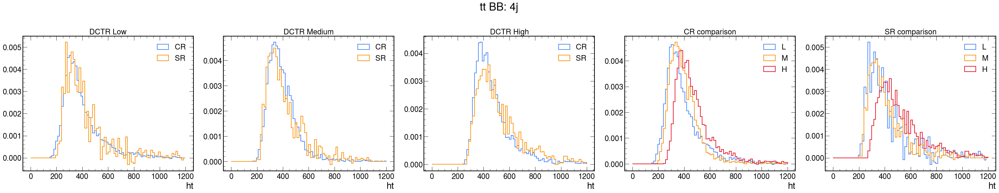

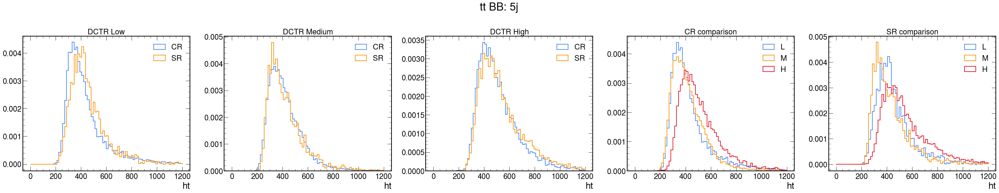

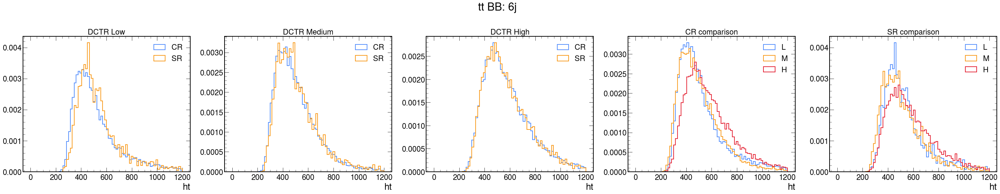

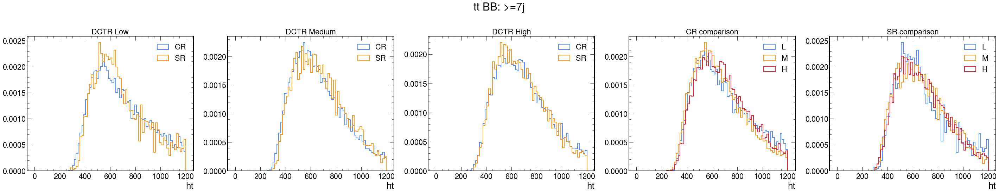

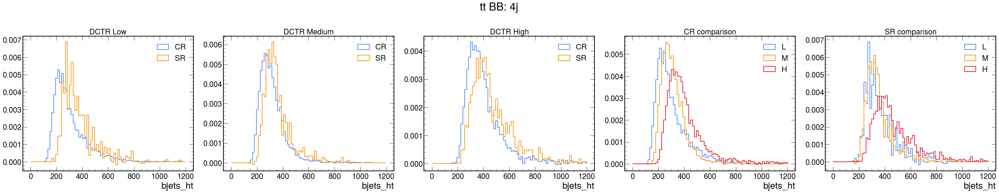

...

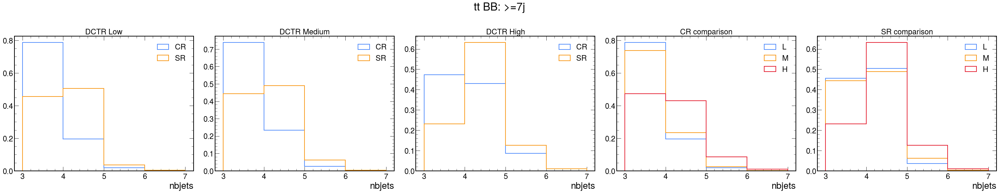

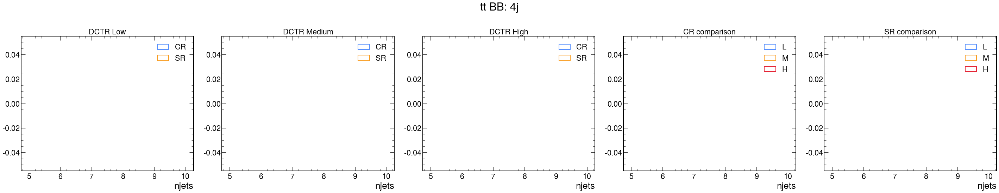

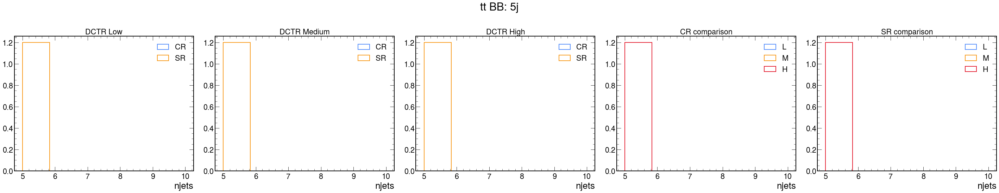

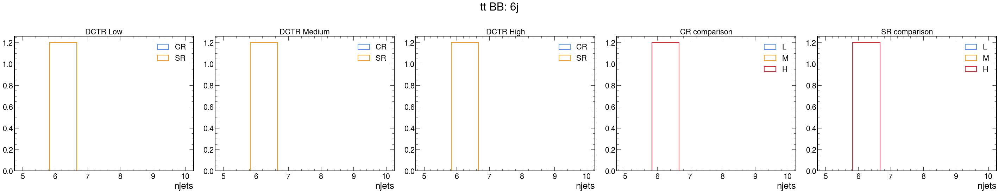

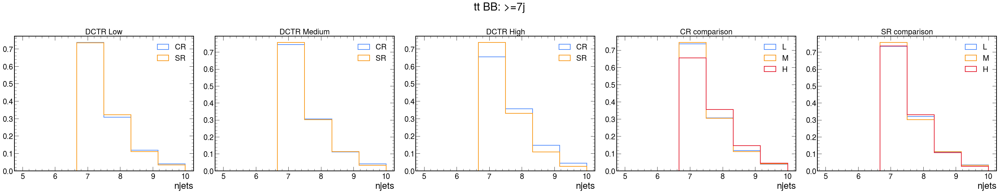

In [162]:
for variable in hist_settings.keys():
    for njets in ["4j","5j","6j", ">=7j"]:
        plot_comparison_SR_DR(variable, njets, mask_ttbb,  text="tt BB", output_folder="/eos/user/d/dvalsecc/www/ttHbbPlots/dctr_regions_plots/", density=True)

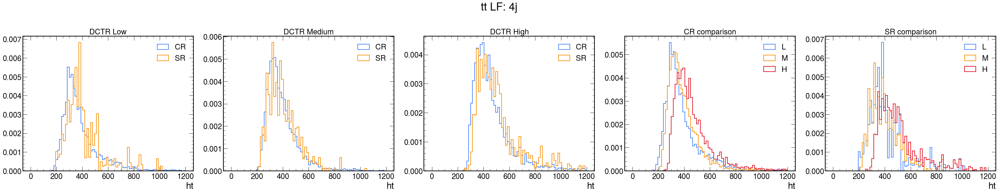

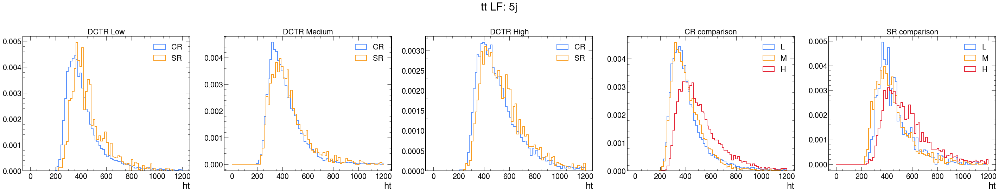

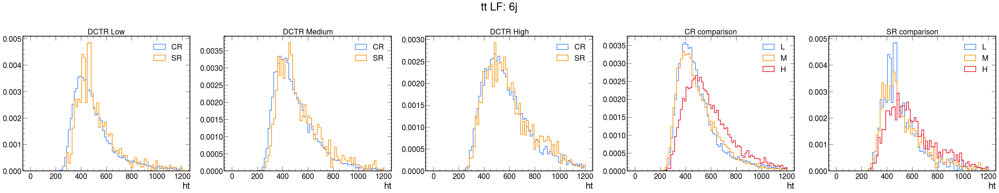

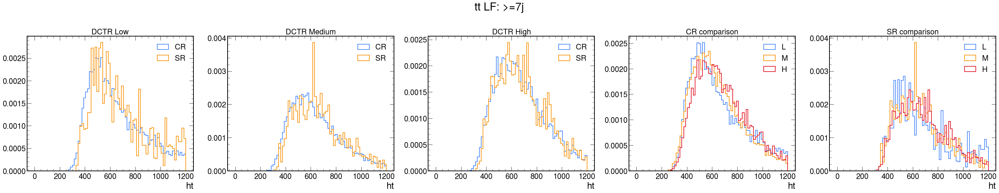

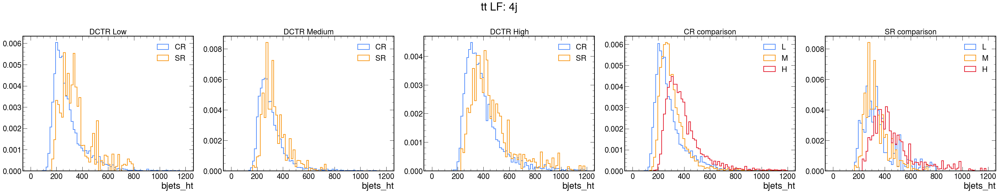

...

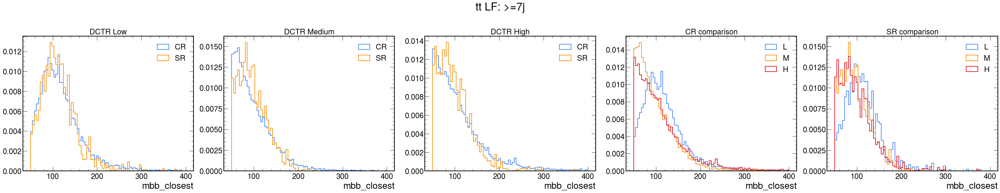

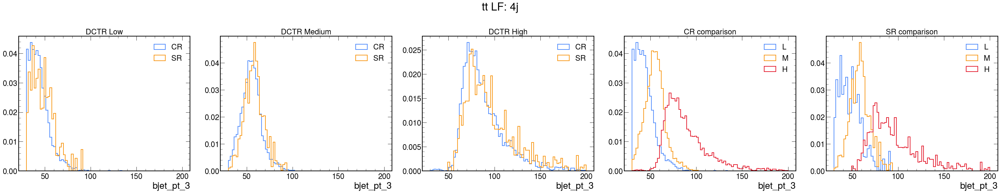

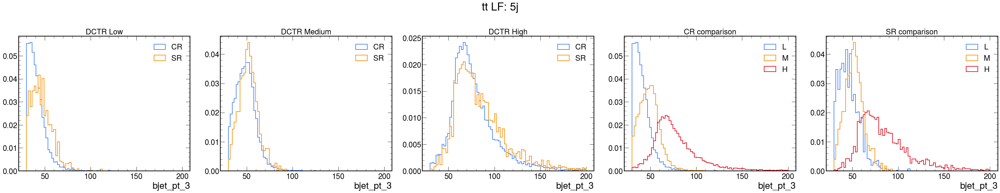

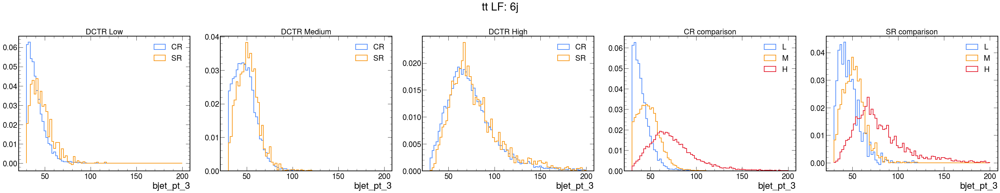

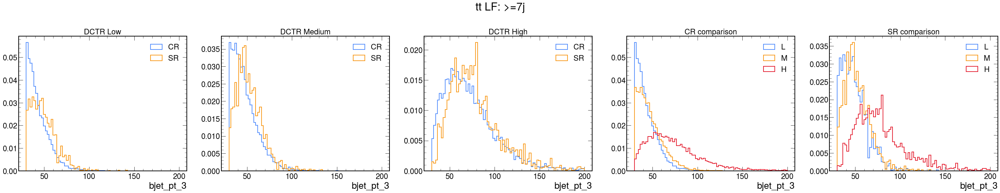

In [106]:
for variable in hist_settings.keys():
    for njets in ["4j","5j","6j", ">=7j"]:
        plot_comparison_SR_DR(variable, njets, mask_ttlf,  text="tt LF" , output_folder="/eos/user/d/dvalsecc/www/ttHbbPlots/dctr_regions_plots/", density=True)

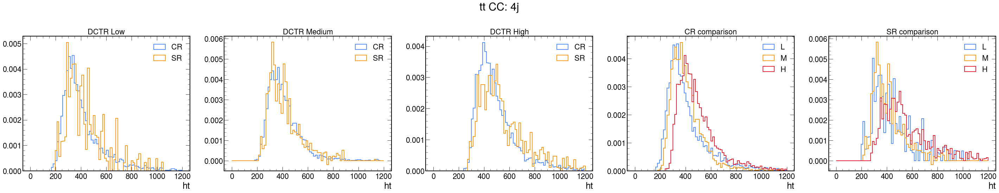

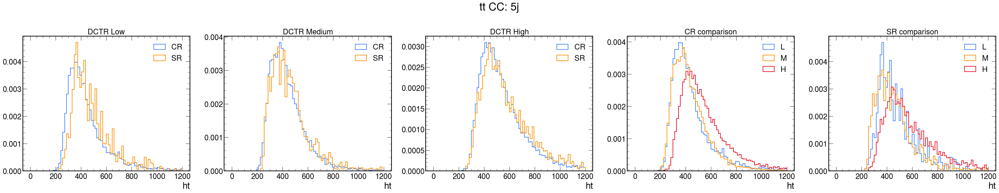

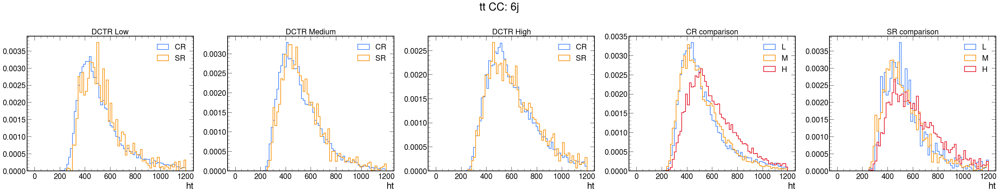

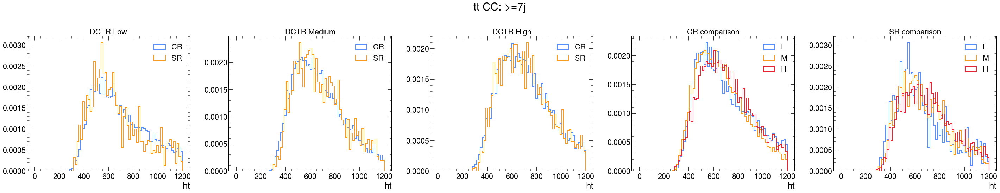

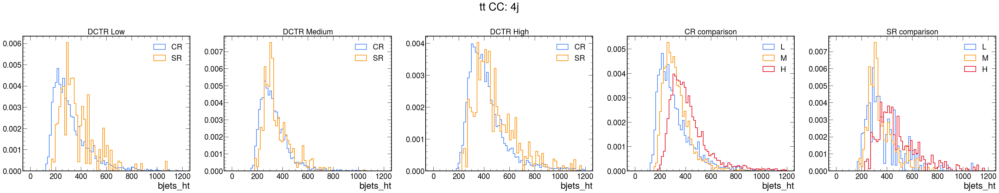

...

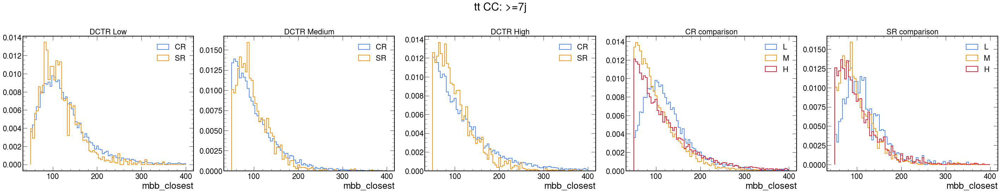

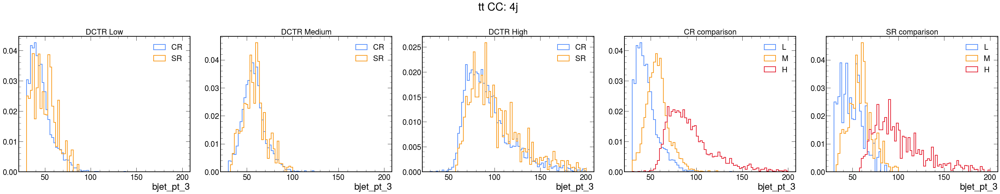

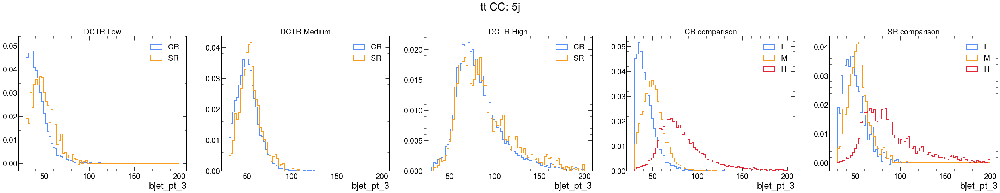

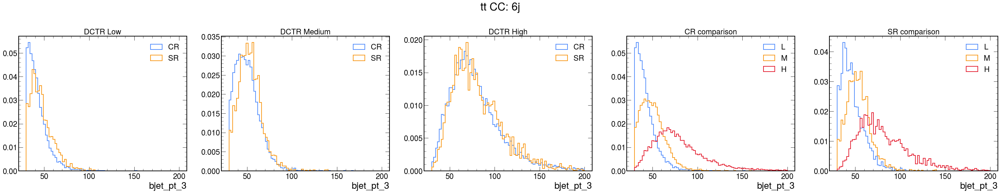

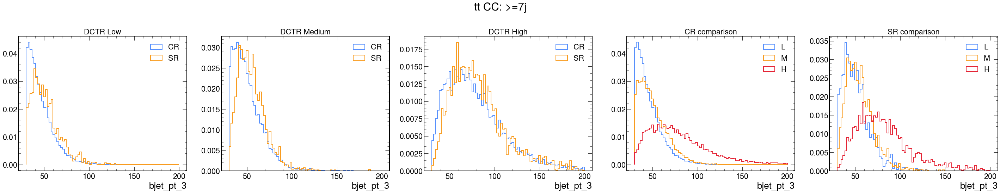

In [107]:
for variable in hist_settings.keys():
    for njets in ["4j","5j","6j", ">=7j"]:
        plot_comparison_SR_DR(variable, njets, mask_ttcc,  text="tt CC" , output_folder="/eos/user/d/dvalsecc/www/ttHbbPlots/dctr_regions_plots/", density=True)

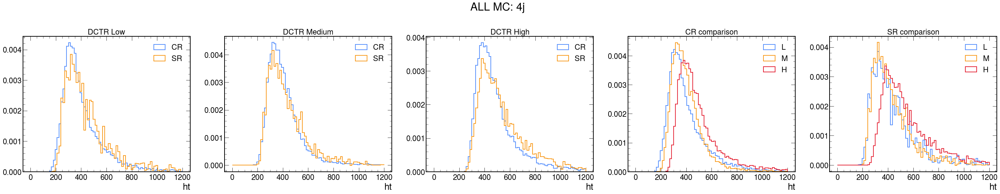

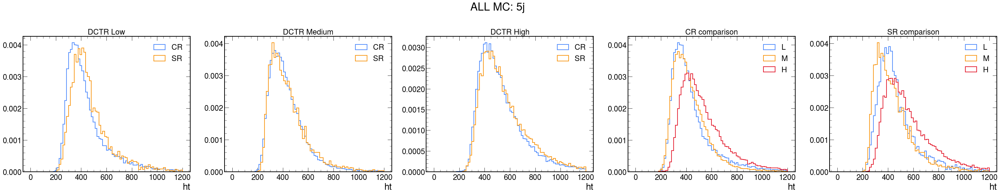

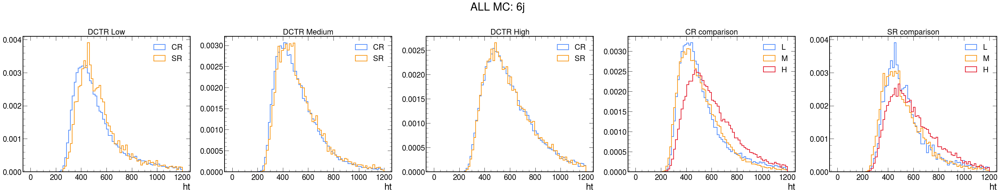

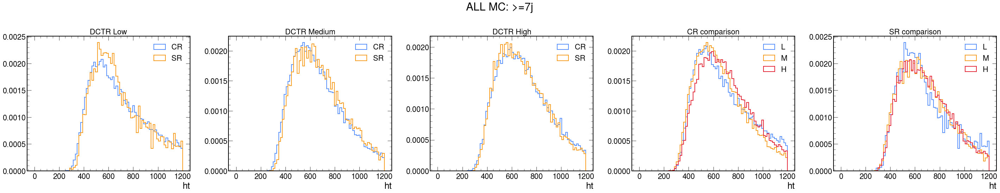

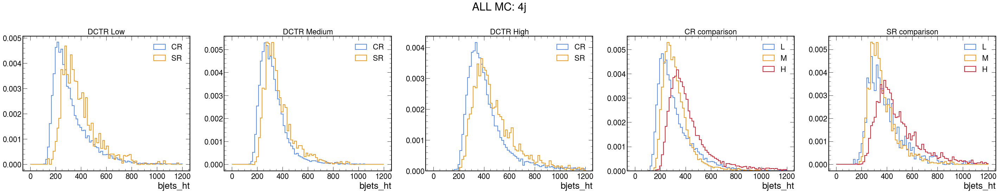

...

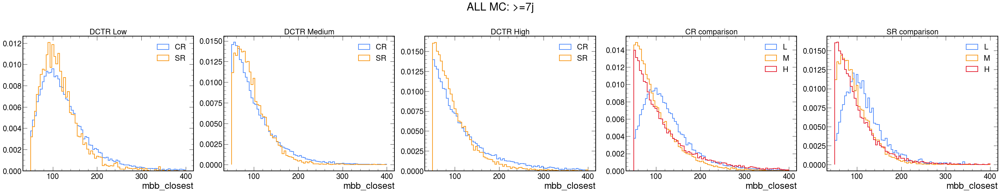

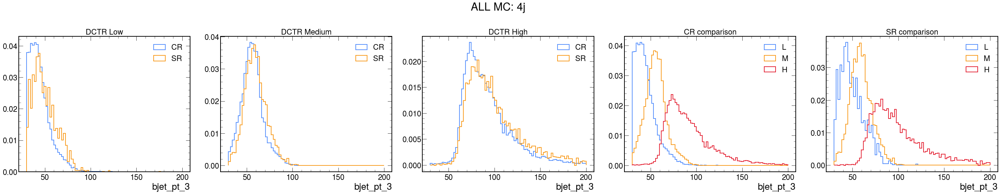

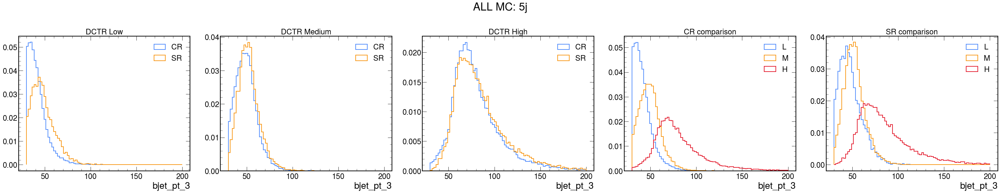

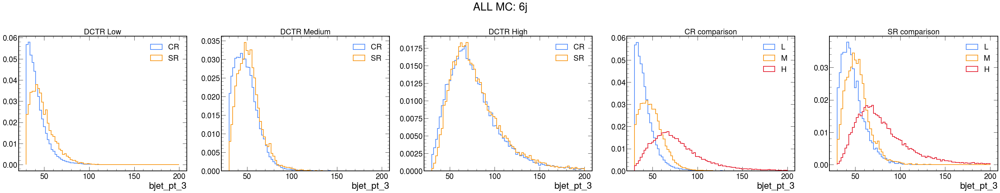

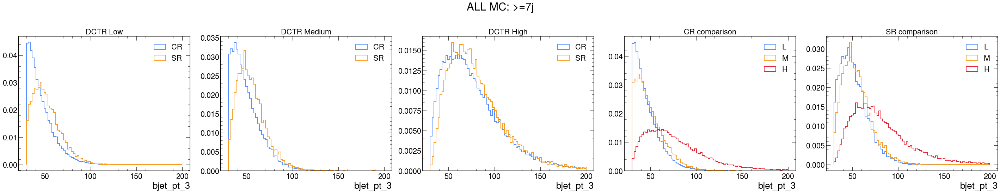

In [108]:
for variable in hist_settings.keys():
    for njets in ["4j","5j","6j", ">=7j"]:
        plot_comparison_SR_DR(variable, njets, mask_mc,  text="ALL MC" ,  output_folder="/eos/user/d/dvalsecc/www/ttHbbPlots/dctr_regions_plots/",density=True)

In [109]:
cols = [ "ht" , "lightjets_ht", "bjets_ht", "bjet_pt_3", "mbb_closest", "drbb_min"]

data = {}
data_raw = {}
for w in ["L", "M","H"]:
    for njets in ["4j","5j","6j", ">=7j"]:
        d = []
        mask = mask_ttbb & dctr_regions[f"{njets}_{w}"]
        for col in cols:
            d.append(ak.to_numpy(events.events[col][mask]))
        
        data[f"{njets}_{w}"]  = pd.DataFrame(np.stack(d, axis=1), columns=cols)
        data_raw[f"{njets}_{w}"]  = d
        data[f"{njets}_{w}"]["bin"] = f"{njets}_{w}"
        data[f"{njets}_{w}"]["njets"] = f"{njets}"

In [110]:
def plot_corr(col1, col2, ranges, bins, initial_mask,title, output_folder, legloc="upper right", nlevels=5):
    f, axs = plt.subplots(1, 4, figsize=(24, 6), dpi=60)
    
    plt.tight_layout()
    for njets, ax in zip(["4j","5j","6j", ">=7j"], axs):
        
        mask = initial_mask & dctr_regions[f"{njets}_L"]
        histL, xedges, yedges = np.histogram2d(  
                        ak.to_numpy(events.events[col1][mask]),
                        ak.to_numpy(events.events[col2][mask]), 
                        weights = ak.to_numpy(weights[mask]),
                       bins=bins, range=ranges, 
                        density=True)
        
        mask = initial_mask & dctr_regions[f"{njets}_M"]
        histM, xedges, yedges = np.histogram2d(  
                        ak.to_numpy(events.events[col1][mask]),
                        ak.to_numpy(events.events[col2][mask]), 
                        weights = ak.to_numpy(weights[mask]),
                       bins=bins, range=ranges, 
                        density=True)
        
        mask = initial_mask & dctr_regions[f"{njets}_H"]
        histH, xedges, yedges = np.histogram2d(  
                        ak.to_numpy(events.events[col1][mask]),
                        ak.to_numpy(events.events[col2][mask]), 
                        weights = ak.to_numpy(weights[mask]),
                       bins=bins, range=ranges, 
                        density=True)
        
        # Get bin centers
        x_centers = (xedges[:-1] + xedges[1:]) / 2
        y_centers = (yedges[:-1] + yedges[1:]) / 2
        X, Y = np.meshgrid(x_centers, y_centers)
        
        CS1 = ax.contour(X, Y, histL.T, nlevels,colors="blue") #L
        CS2 = ax.contour(X, Y, histM.T, nlevels, colors="black") #M
        CS3 = ax.contour(X, Y, histH.T, nlevels,colors="red")  #H

        plt.clabel(CS1, inline=True, fontsize=8, fmt='%1.0f')
        plt.clabel(CS2, inline=True, fontsize=8, fmt='%1.0f')
        plt.clabel(CS3, inline=True, fontsize=8, fmt='%1.0f')
        
        legend_elements = [
            Line2D([0], [0], color='blue', label='L'),
            Line2D([0], [0], color='black',  label='M'),
            Line2D([0], [0], color='red', label='H')
        ]
        ax.legend(handles=legend_elements, loc=legloc)
        
        ax.set_title(njets)
        ax.set_xlabel(col1)
        ax.set_ylabel(col2)
        
    f.suptitle(f"{title}", fontsize="large")
    os.makedirs(output_folder, exist_ok=True)
    plt.savefig(f"{output_folder}/dctr_correlation_comparison_{col1}_{col2}_{njets}_{title}.pdf")
    plt.savefig(f"{output_folder}/dctr_correlation_comparison_{col1}_{col2}_{njets}_{title}.png")

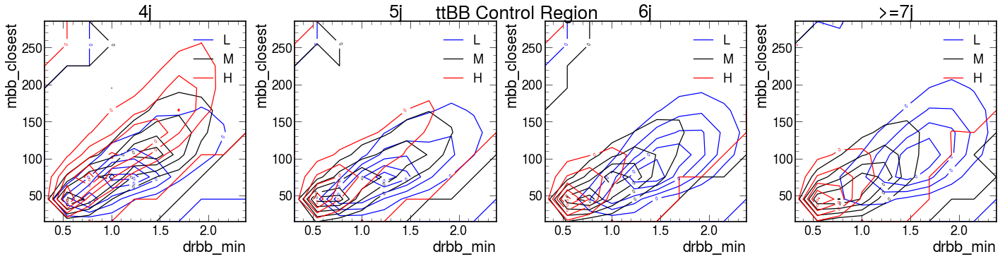

In [111]:
plot_corr("drbb_min" ,"mbb_closest", ((0.2, 2.5), (0, 300)), 10, initial_mask=(mask_ttbb&~isSR),
          title="ttBB Control Region", output_folder="/eos/user/d/dvalsecc/www/ttHbbPlots/dctr_regions_plots/correlations/")

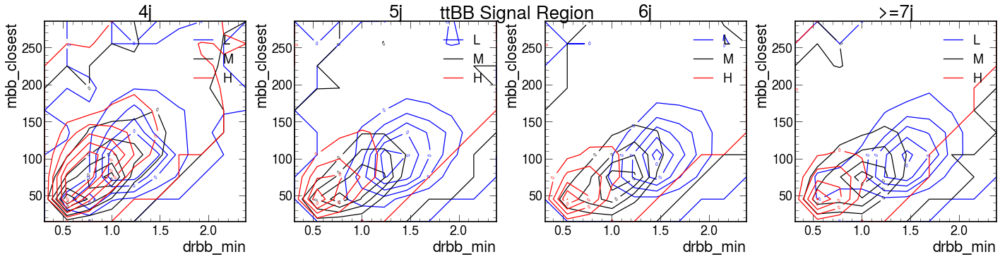

In [156]:
plot_corr("drbb_min" ,"mbb_closest", ((0.2, 2.5),  (0, 300)), 10, initial_mask=(mask_ttbb&isSR), title="ttBB Signal Region", output_folder="/eos/user/d/dvalsecc/www/ttHbbPlots/dctr_regions_plots/correlations/")

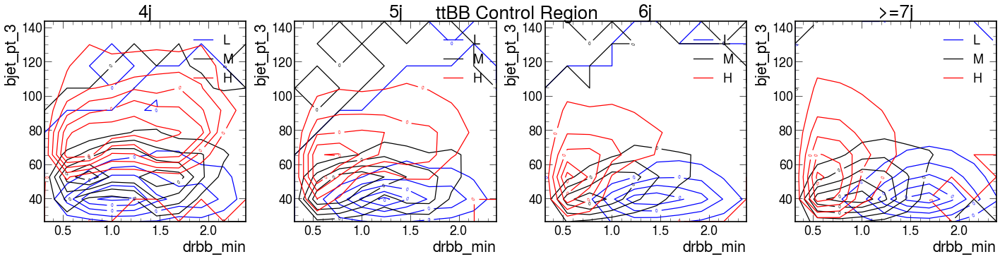

In [157]:
plot_corr("drbb_min" ,"bjet_pt_3", ((0.2, 2.5), (20, 150)), 10, nlevels=5, initial_mask=(mask_ttbb&~isSR), title="ttBB Control Region", output_folder="/eos/user/d/dvalsecc/www/ttHbbPlots/dctr_regions_plots/correlations/")

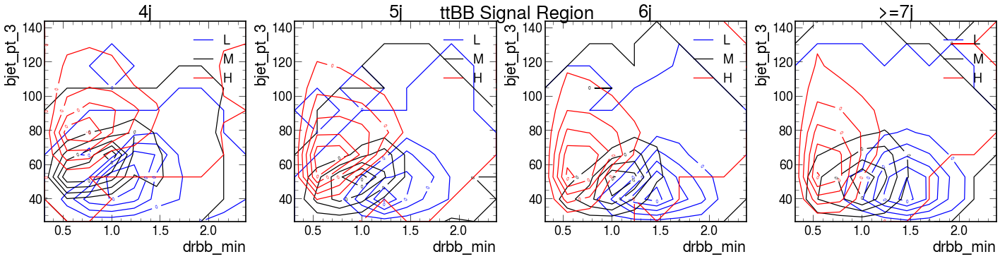

In [158]:
plot_corr("drbb_min" ,"bjet_pt_3", ((0.2, 2.5), (20, 150)), 10, nlevels=5, initial_mask=(mask_ttbb&isSR),title="ttBB Signal Region", output_folder="/eos/user/d/dvalsecc/www/ttHbbPlots/dctr_regions_plots/correlations/")

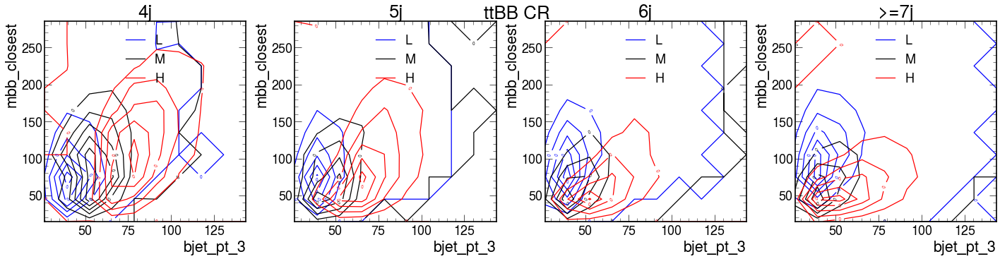

In [159]:
plot_corr("bjet_pt_3" ,"mbb_closest", ((20, 150), (0, 300)), 10, initial_mask=(mask_ttbb&~isSR), legloc="upper center",title="ttBB CR", output_folder="/eos/user/d/dvalsecc/www/ttHbbPlots/dctr_regions_plots/correlations/")

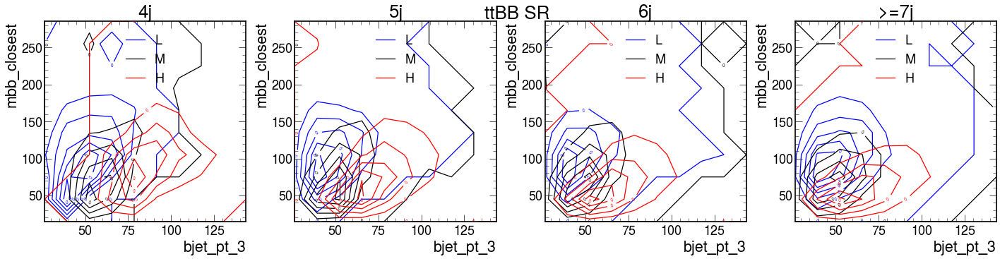

In [160]:
plot_corr("bjet_pt_3" ,"mbb_closest", ((20, 150), (0, 300)), 10, initial_mask=(mask_ttbb&isSR), legloc="upper center", title="ttBB SR", output_folder="/eos/user/d/dvalsecc/www/ttHbbPlots/dctr_regions_plots/correlations/")

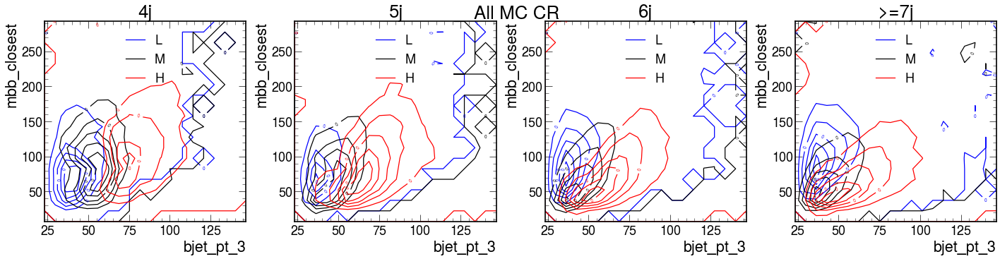

In [117]:
plot_corr("bjet_pt_3" ,"mbb_closest", ((20, 150), (0, 300)), 20, initial_mask=(mask_mc&~mask_ttbb&~isSR), legloc="upper center",title="All MC CR", output_folder="/eos/user/d/dvalsecc/www/ttHbbPlots/dctr_regions_plots/correlations/")

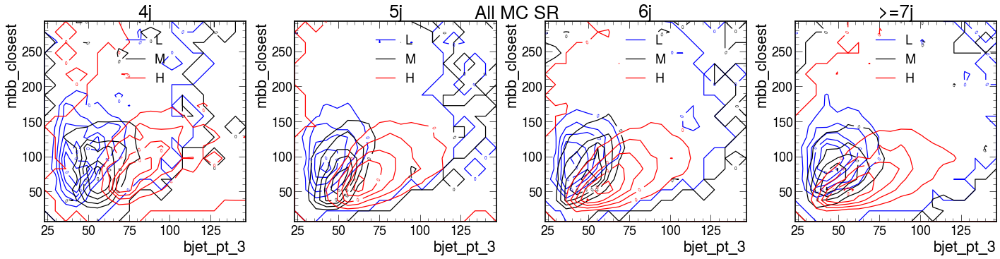

In [118]:
plot_corr("bjet_pt_3" ,"mbb_closest", ((20, 150), (0, 300)), 20, initial_mask=(mask_mc&~mask_ttbb&isSR), legloc="upper center", title="All MC SR", output_folder="/eos/user/d/dvalsecc/www/ttHbbPlots/dctr_regions_plots/correlations/")

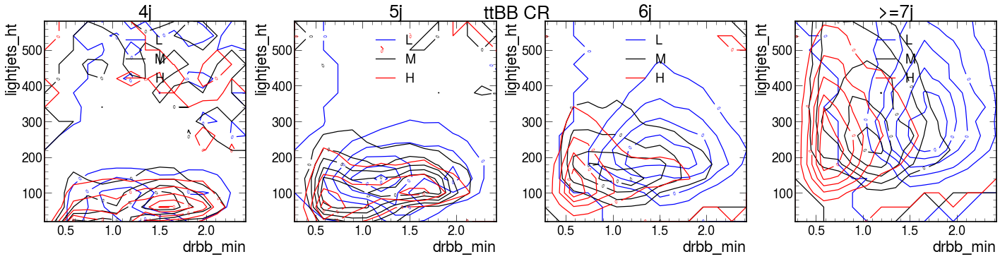

In [119]:
plot_corr("drbb_min" ,"lightjets_ht", ((0.2, 2.5), (0, 600)), 15, initial_mask=(mask_ttbb&~isSR), legloc="upper center", title="ttBB CR", output_folder="/eos/user/d/dvalsecc/www/ttHbbPlots/dctr_regions_plots/correlations/")

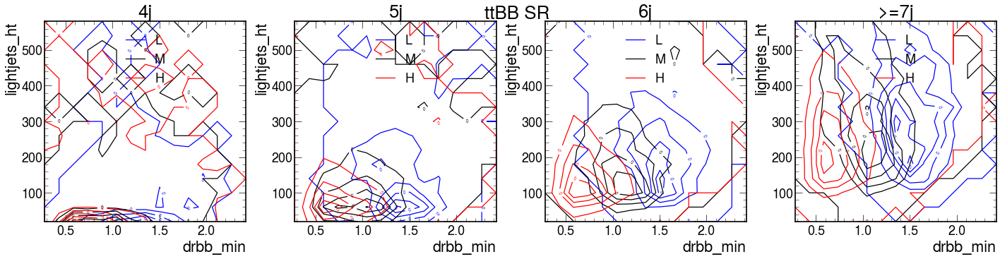

In [120]:
plot_corr("drbb_min" ,"lightjets_ht", ((0.2, 2.5), (0, 600)), 15, initial_mask=(mask_ttbb&isSR), legloc="upper center", title="ttBB SR", output_folder="/eos/user/d/dvalsecc/www/ttHbbPlots/dctr_regions_plots/correlations/")

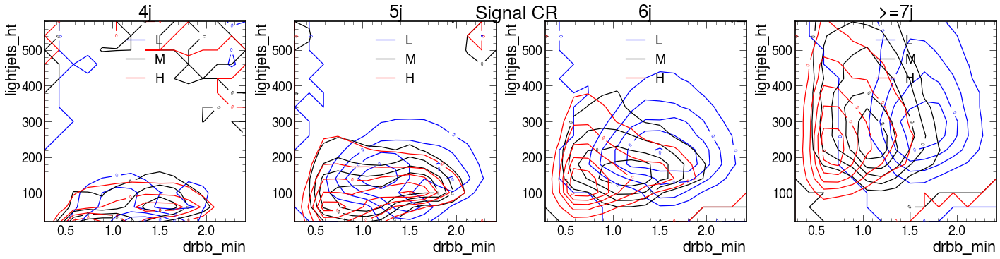

In [121]:
plot_corr("drbb_min" ,"lightjets_ht", ((0.2, 2.5), (0, 600)), 15, initial_mask=(mask_mc&mask_signal&~isSR), legloc="upper center", title="Signal CR", output_folder="/eos/user/d/dvalsecc/www/ttHbbPlots/dctr_regions_plots/correlations/")

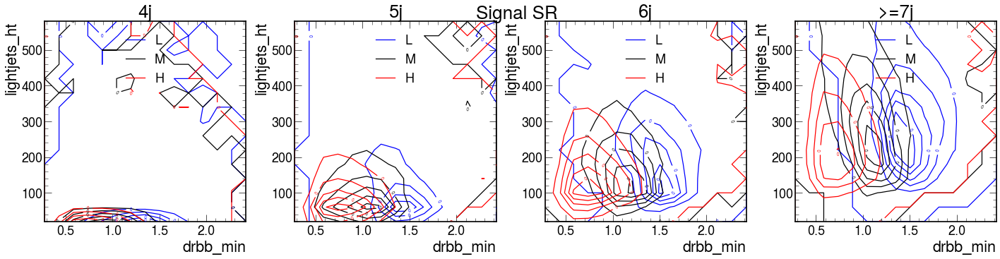

In [122]:
plot_corr("drbb_min" ,"lightjets_ht", ((0.2, 2.5), (0, 600)), 15, initial_mask=(mask_mc&mask_signal&isSR), legloc="upper center", title="Signal SR", output_folder="/eos/user/d/dvalsecc/www/ttHbbPlots/dctr_regions_plots/correlations/")

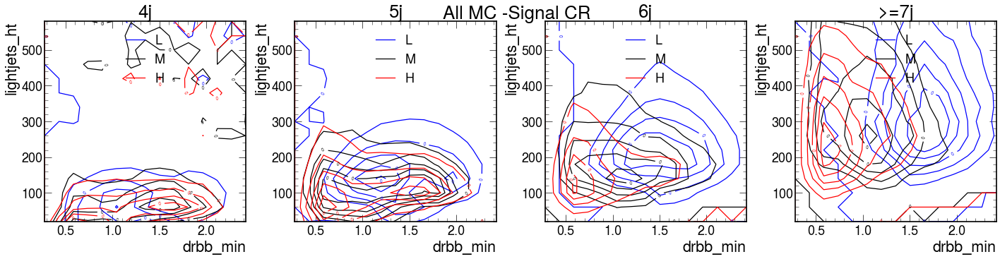

In [123]:
plot_corr("drbb_min" ,"lightjets_ht", ((0.2, 2.5), (0, 600)), 15, initial_mask=(mask_mc&~mask_signal&~isSR), legloc="upper center", title="All MC -Signal CR", output_folder="/eos/user/d/dvalsecc/www/ttHbbPlots/dctr_regions_plots/correlations/")

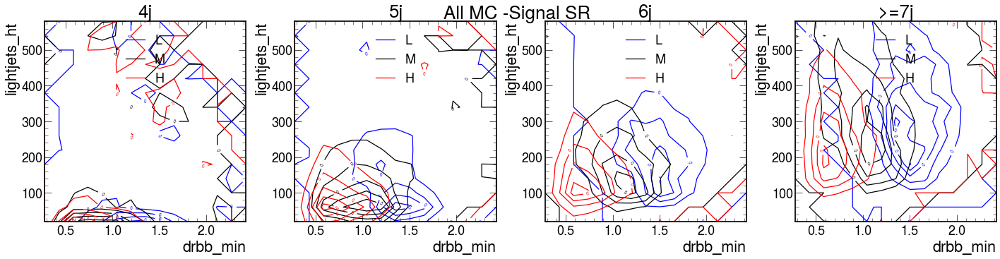

In [124]:
plot_corr("drbb_min" ,"lightjets_ht", ((0.2, 2.5), (0, 600)), 15, initial_mask=(mask_mc&~mask_signal&isSR), legloc="upper center", title="All MC -Signal SR", output_folder="/eos/user/d/dvalsecc/www/ttHbbPlots/dctr_regions_plots/correlations/")

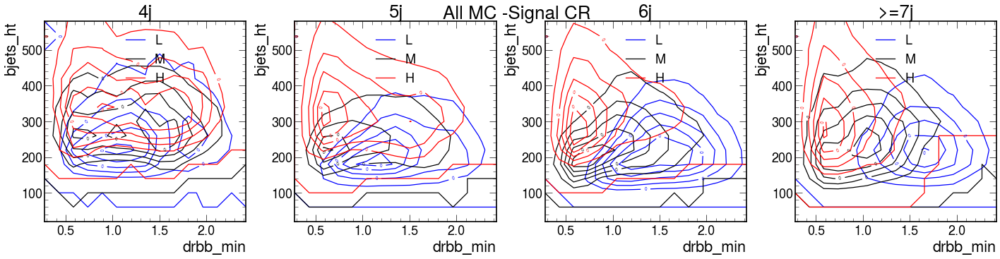

In [125]:
plot_corr("drbb_min" ,"bjets_ht", ((0.2, 2.5), (0, 600)), 15, initial_mask=(mask_mc&~mask_signal&~isSR), legloc="upper center", title="All MC -Signal CR", output_folder="/eos/user/d/dvalsecc/www/ttHbbPlots/dctr_regions_plots/correlations/")

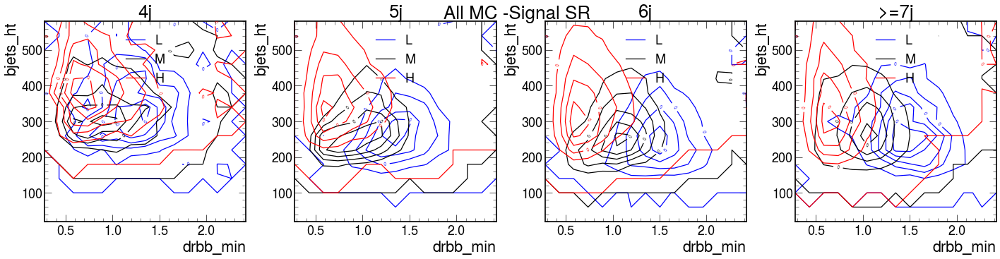

In [126]:
plot_corr("drbb_min" ,"bjets_ht", ((0.2, 2.5), (0, 600)), 15, initial_mask=(mask_mc&~mask_signal&isSR), legloc="upper center", title="All MC -Signal SR", output_folder="/eos/user/d/dvalsecc/www/ttHbbPlots/dctr_regions_plots/correlations/")

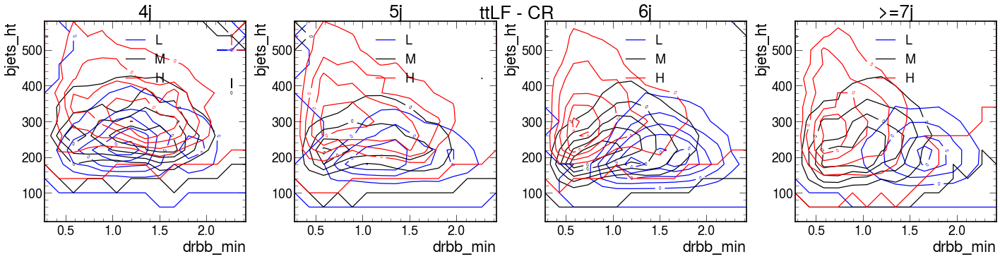

In [128]:
plot_corr("drbb_min" ,"bjets_ht", ((0.2, 2.5), (0, 600)), 15, initial_mask=(mask_ttlf&~isSR), legloc="upper center", title="ttLF - CR", output_folder="/eos/user/d/dvalsecc/www/ttHbbPlots/dctr_regions_plots/correlations/")

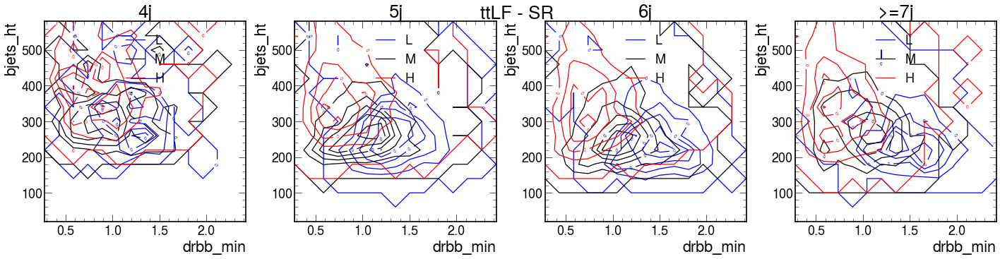

In [129]:
plot_corr("drbb_min" ,"bjets_ht", ((0.2, 2.5), (0, 600)), 15, initial_mask=(mask_ttlf&isSR), legloc="upper center", title="ttLF - SR", output_folder="/eos/user/d/dvalsecc/www/ttHbbPlots/dctr_regions_plots/correlations/")

# Investigate variables

Text(1, 0, 'bjets_ht')

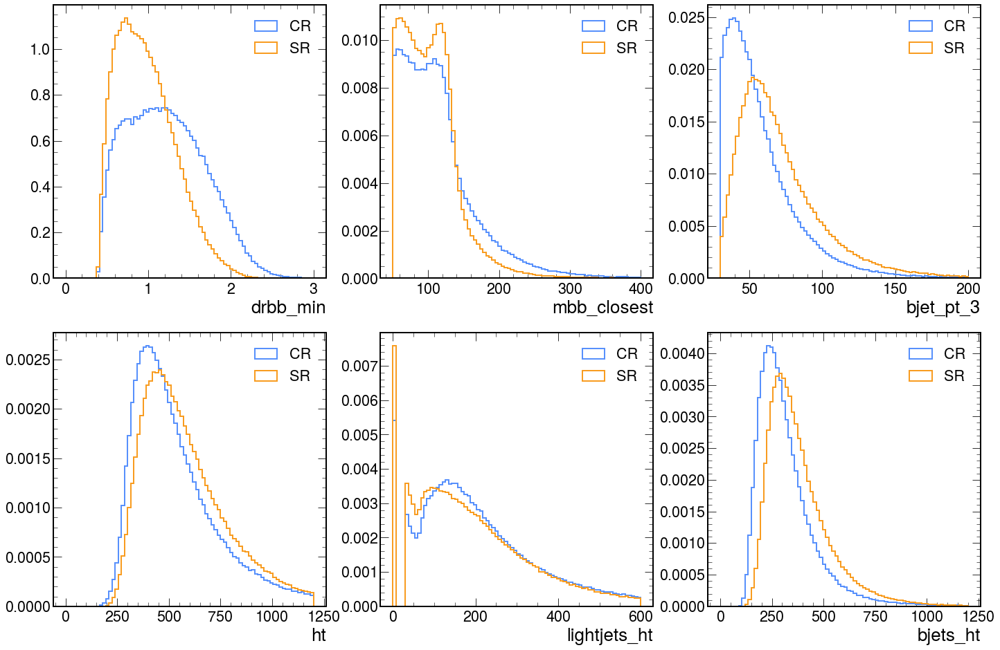

In [161]:
f, axs = plt.subplots(2, 3, figsize=(24, 16))
col="drbb_min"
axs[0,0].hist(events.events[col][mask_signal & ~isSR], weights=weights[mask_signal & ~isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="CR", density=True);
axs[0,0].hist(events.events[col][mask_signal & isSR], weights=weights[mask_signal & isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="SR",density=True);
axs[0,0].legend()
axs[0,0].set_xlabel(col)

col="mbb_closest"
axs[0,1].hist(events.events[col][mask_signal & ~isSR], weights=weights[mask_signal & ~isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="CR", density=True);
axs[0,1].hist(events.events[col][mask_signal & isSR], weights=weights[mask_signal & isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="SR",density=True);
axs[0,1].legend()
axs[0,1].set_xlabel(col)

col="bjet_pt_3"
axs[0,2].hist(events.events[col][mask_signal & ~isSR], weights=weights[mask_signal & ~isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="CR", density=True);
axs[0,2].hist(events.events[col][mask_signal & isSR], weights=weights[mask_signal & isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="SR",density=True);
axs[0,2].legend()
axs[0,2].set_xlabel(col)


col="ht"
axs[1,0].hist(events.events[col][mask_signal & ~isSR], weights=weights[mask_signal & ~isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="CR", density=True);
axs[1,0].hist(events.events[col][mask_signal & isSR], weights=weights[mask_signal & isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="SR",density=True);
axs[1,0].legend()
axs[1,0].set_xlabel(col)

col="lightjets_ht"
axs[1,1].hist(events.events[col][mask_signal & ~isSR], weights=weights[mask_signal & ~isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="CR", density=True);
axs[1,1].hist(events.events[col][mask_signal & isSR], weights=weights[mask_signal & isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="SR",density=True);
axs[1,1].legend()
axs[1,1].set_xlabel(col)


col="bjets_ht"
axs[1,2].hist(events.events[col][mask_signal & ~isSR], weights=weights[mask_signal & ~isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="CR", density=True);
axs[1,2].hist(events.events[col][mask_signal & isSR], weights=weights[mask_signal & isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="SR",density=True);
axs[1,2].legend()
axs[1,2].set_xlabel(col)

Text(1, 0, 'bjets_ht')

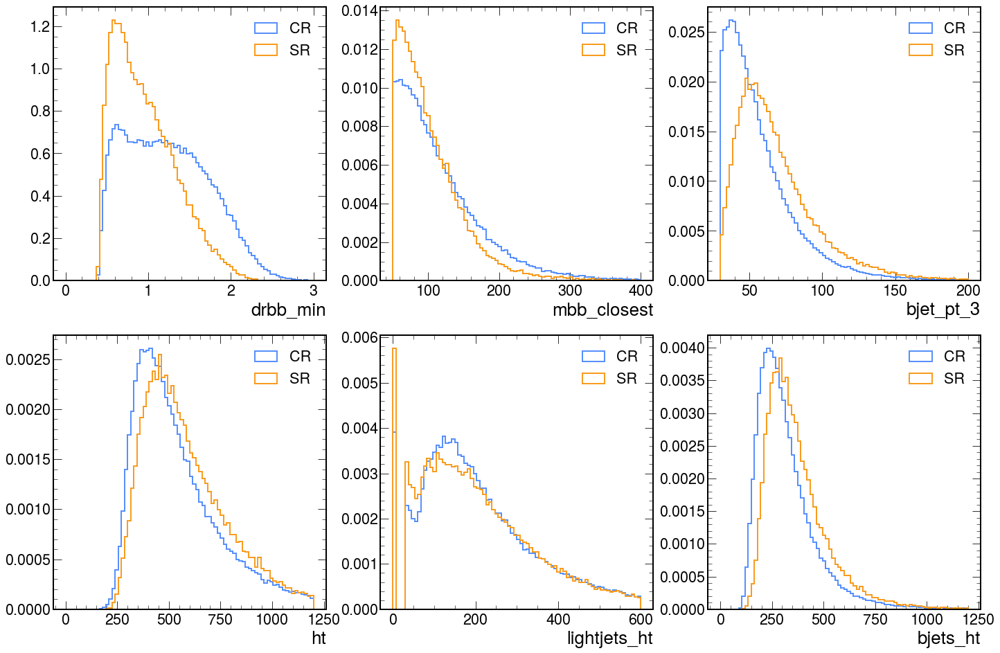

In [138]:
f, axs = plt.subplots(2, 3, figsize=(24, 16))
col="drbb_min"
axs[0,0].hist(events.events[col][mask_ttbb & ~isSR], weights=weights[mask_ttbb & ~isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="CR", density=True);
axs[0,0].hist(events.events[col][mask_ttbb & isSR], weights=weights[mask_ttbb & isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="SR",density=True);
axs[0,0].legend()
axs[0,0].set_xlabel(col)

col="mbb_closest"
axs[0,1].hist(events.events[col][mask_ttbb & ~isSR], weights=weights[mask_ttbb & ~isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="CR", density=True);
axs[0,1].hist(events.events[col][mask_ttbb & isSR], weights=weights[mask_ttbb & isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="SR",density=True);
axs[0,1].legend()
axs[0,1].set_xlabel(col)

col="bjet_pt_3"
axs[0,2].hist(events.events[col][mask_ttbb & ~isSR], weights=weights[mask_ttbb & ~isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="CR", density=True);
axs[0,2].hist(events.events[col][mask_ttbb & isSR], weights=weights[mask_ttbb & isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="SR",density=True);
axs[0,2].legend()
axs[0,2].set_xlabel(col)


col="ht"
axs[1,0].hist(events.events[col][mask_ttbb & ~isSR], weights=weights[mask_ttbb & ~isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="CR", density=True);
axs[1,0].hist(events.events[col][mask_ttbb & isSR], weights=weights[mask_ttbb & isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="SR",density=True);
axs[1,0].legend()
axs[1,0].set_xlabel(col)

col="lightjets_ht"
axs[1,1].hist(events.events[col][mask_ttbb & ~isSR], weights=weights[mask_ttbb & ~isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="CR", density=True);
axs[1,1].hist(events.events[col][mask_ttbb & isSR], weights=weights[mask_ttbb & isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="SR",density=True);
axs[1,1].legend()
axs[1,1].set_xlabel(col)


col="bjets_ht"
axs[1,2].hist(events.events[col][mask_ttbb & ~isSR], weights=weights[mask_ttbb & ~isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="CR", density=True);
axs[1,2].hist(events.events[col][mask_ttbb & isSR], weights=weights[mask_ttbb & isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="SR",density=True);
axs[1,2].legend()
axs[1,2].set_xlabel(col)

Text(1, 0, 'bjets_ht')

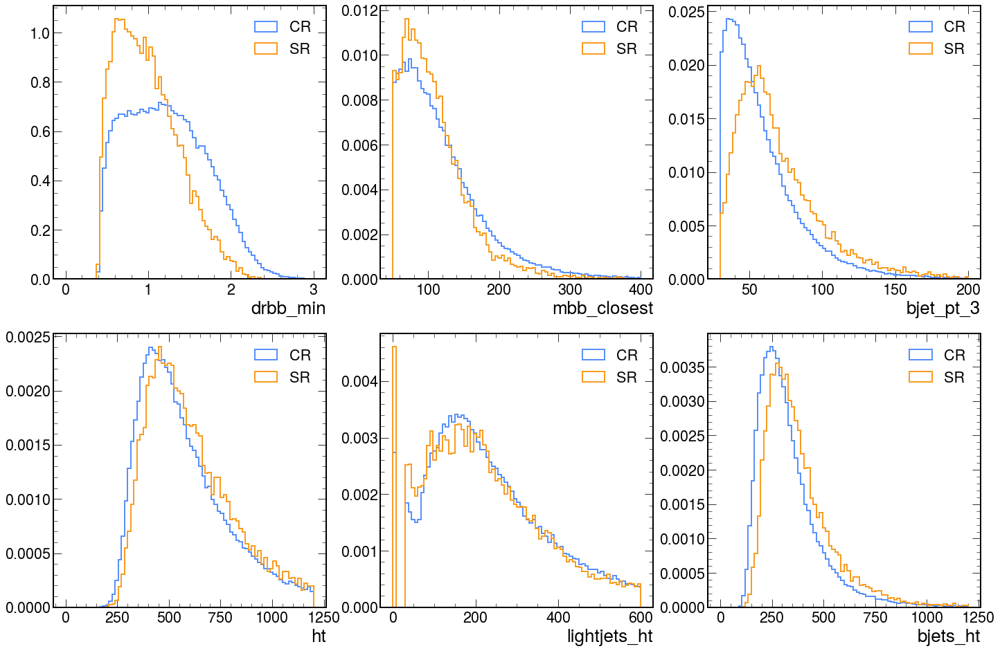

In [149]:
f, axs = plt.subplots(2, 3, figsize=(24, 16))
col="drbb_min"
axs[0,0].hist(events.events[col][mask_ttcc & ~isSR], weights=weights[mask_ttcc & ~isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="CR", density=True);
axs[0,0].hist(events.events[col][mask_ttcc & isSR], weights=weights[mask_ttcc & isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="SR",density=True);
axs[0,0].legend()
axs[0,0].set_xlabel(col)

col="mbb_closest"
axs[0,1].hist(events.events[col][mask_ttcc & ~isSR], weights=weights[mask_ttcc & ~isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="CR", density=True);
axs[0,1].hist(events.events[col][mask_ttcc & isSR], weights=weights[mask_ttcc & isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="SR",density=True);
axs[0,1].legend()
axs[0,1].set_xlabel(col)

col="bjet_pt_3"
axs[0,2].hist(events.events[col][mask_ttcc & ~isSR], weights=weights[mask_ttcc & ~isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="CR", density=True);
axs[0,2].hist(events.events[col][mask_ttcc & isSR], weights=weights[mask_ttcc & isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="SR",density=True);
axs[0,2].legend()
axs[0,2].set_xlabel(col)


col="ht"
axs[1,0].hist(events.events[col][mask_ttcc & ~isSR], weights=weights[mask_ttcc & ~isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="CR", density=True);
axs[1,0].hist(events.events[col][mask_ttcc & isSR], weights=weights[mask_ttcc & isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="SR",density=True);
axs[1,0].legend()
axs[1,0].set_xlabel(col)

col="lightjets_ht"
axs[1,1].hist(events.events[col][mask_ttcc & ~isSR], weights=weights[mask_ttcc & ~isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="CR", density=True);
axs[1,1].hist(events.events[col][mask_ttcc & isSR], weights=weights[mask_ttcc & isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="SR",density=True);
axs[1,1].legend()
axs[1,1].set_xlabel(col)


col="bjets_ht"
axs[1,2].hist(events.events[col][mask_ttcc & ~isSR], weights=weights[mask_ttcc & ~isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="CR", density=True);
axs[1,2].hist(events.events[col][mask_ttcc & isSR], weights=weights[mask_ttcc & isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="SR",density=True);
axs[1,2].legend()
axs[1,2].set_xlabel(col)

Text(1, 0, 'bjets_ht')

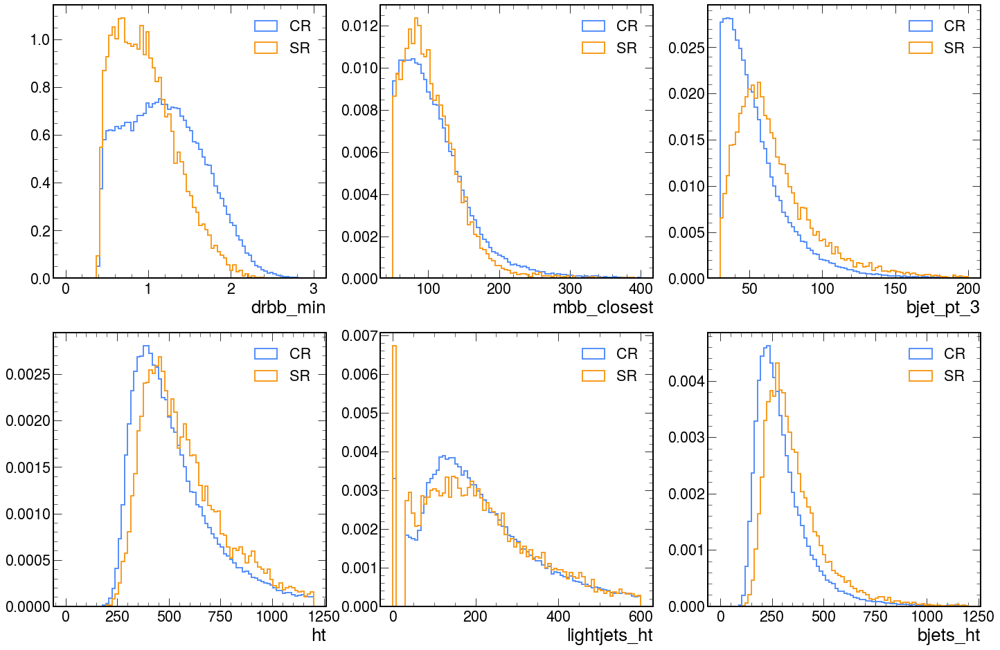

In [150]:
f, axs = plt.subplots(2, 3, figsize=(24, 16))
col="drbb_min"
axs[0,0].hist(events.events[col][mask_ttlf & ~isSR], weights=weights[mask_ttlf & ~isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="CR", density=True);
axs[0,0].hist(events.events[col][mask_ttlf & isSR], weights=weights[mask_ttlf & isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="SR",density=True);
axs[0,0].legend()
axs[0,0].set_xlabel(col)

col="mbb_closest"
axs[0,1].hist(events.events[col][mask_ttlf & ~isSR], weights=weights[mask_ttlf & ~isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="CR", density=True);
axs[0,1].hist(events.events[col][mask_ttlf & isSR], weights=weights[mask_ttlf & isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="SR",density=True);
axs[0,1].legend()
axs[0,1].set_xlabel(col)

col="bjet_pt_3"
axs[0,2].hist(events.events[col][mask_ttlf & ~isSR], weights=weights[mask_ttlf & ~isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="CR", density=True);
axs[0,2].hist(events.events[col][mask_ttlf & isSR], weights=weights[mask_ttlf & isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="SR",density=True);
axs[0,2].legend()
axs[0,2].set_xlabel(col)


col="ht"
axs[1,0].hist(events.events[col][mask_ttlf & ~isSR], weights=weights[mask_ttlf & ~isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="CR", density=True);
axs[1,0].hist(events.events[col][mask_ttlf & isSR], weights=weights[mask_ttlf & isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="SR",density=True);
axs[1,0].legend()
axs[1,0].set_xlabel(col)

col="lightjets_ht"
axs[1,1].hist(events.events[col][mask_ttlf & ~isSR], weights=weights[mask_ttlf & ~isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="CR", density=True);
axs[1,1].hist(events.events[col][mask_ttlf & isSR], weights=weights[mask_ttlf & isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="SR",density=True);
axs[1,1].legend()
axs[1,1].set_xlabel(col)


col="bjets_ht"
axs[1,2].hist(events.events[col][mask_ttlf & ~isSR], weights=weights[mask_ttlf & ~isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="CR", density=True);
axs[1,2].hist(events.events[col][mask_ttlf & isSR], weights=weights[mask_ttlf & isSR], 
             bins=hist_settings[col][0],range=hist_settings[col][1:],
             histtype="step", linewidth=2, label="SR",density=True);
axs[1,2].legend()
axs[1,2].set_xlabel(col)